In [0]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score, \
    adjusted_mutual_info_score, adjusted_rand_score
from sklearn.metrics import silhouette_samples
from sklearn.metrics.cluster import contingency_matrix



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


#Exploratory analysis
**story**
1. Visualize features
2. Find opitmal clusters
3. Find strength of clusters
4. Analyze cluster

**Questions**
1. Are there particular features you want to see visualized ( I have some features in 3d)
2. What features do you think are important
3. when given clusters, what methodologies in psychology would you employ in analyzing clusters



In [0]:
# !git clone https://ChefQ@github.com/ChefQ/datasets.git
# !unzip /content/datasets/Data.zip
# contact oluwaseun.cardoso@mail.utoronto.ca to get access to dataset

#Utility functions

In [0]:
missing_values = ["", ""]
def preprocess(df):
  columns = list(zip(list(df.dtypes ),list(df.columns)))
  for item_type, name in columns:
    if item_type.name == 'object':
      df[name] = pd.to_numeric(df[name],errors='coerce')
  return df

def preliminaries(PATH):
    missing_values = [" ", ""]
    # replaced missing values with zeros
    # consider maybe removing those rows if time permits you

    raw = pd.read_csv(PATH, na_values = missing_values)
    #NOTE: this needs revision This is only particular to Sample B
    raw.loc[:,['Liked', 'SexAtt', "LikYes", 'FSexAtt']] = raw.loc[:,['Liked', 'SexAtt', "LikYes", 'FSexAtt']].fillna(1)
    raw.loc[raw["maleID"] == 219,"Liked":"Common"] # this guy did not enter any values for dependent measures... so i a gave him a 1
    raw = raw.fillna(0)
    return raw


def dm_3d(dm,target,title):
  X = raw[dm[0]].values.astype("int")
  Y = raw[dm[1]].values.astype("int")
  Z = raw[dm[2]].values.astype("int")
  yesorno =  raw[target].values.astype("int")
  colors = ["r", "g"]


  
  fig = plt.figure(figsize = (18, 11))
  ax = fig.add_subplot(111, projection = '3d')
  ax.set_title(title)
  for i in range(len(X)):
    scatter = ax.scatter(X[i], Y[i], Z[i], color = colors[yesorno[i]])
  legend = ax.legend(*scatter.legend_elements(), title= "yes = green , no = red") # don't know why this isn't working 
  ax.add_artist(legend)
  ax.set_xlabel(dm[0])
  ax.set_ylabel(dm[1])
  ax.set_zlabel(dm[2])
  plt.show()
 

def rotate_3d(dm,target,title):
  X = raw[dm[0]].values.astype("int")
  Y = raw[dm[1]].values.astype("int")
  Z = raw[dm[2]].values.astype("int")
  yesorno =  raw[target].values.astype("int")
  colors = ["r", "g"]


  
  fig = plt.figure(figsize = (18, 11))
  ax = Axes3D(fig)
  ax.set_title(title)
  for i in range(len(X)):
    scatter = ax.scatter(X[i], Y[i], Z[i], color = colors[yesorno[i]])
  legend = ax.legend(*scatter.legend_elements(), title= "yes = green , no = red") # don't know why this isn't working 
  ax.add_artist(legend)
  ax.set_xlabel(dm[0])
  ax.set_ylabel(dm[1])
  ax.set_zlabel(dm[2])
  #plt.show()
  def rotate(angle):
     ax.view_init(azim=angle)
  angle = 3
  ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=50)
  print("almost there")
  
  return fig, ani

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation






def tsne_data(data, num_com, perplex):
  # Project the dataset on a bidimensional plan
  tsne = TSNE(n_components = num_com , perplexity=perplex, random_state=1000)
  data_tsne = tsne.fit_transform(data)
  axis = ['x', 'y'] if num_com == 2 else ['x', 'y', 'z']
  tsne_df = pd.DataFrame(data_tsne, columns= axis, index=raw_post.index)
  return tsne_df

def plot(dff, hue = None ,size = None , style = None, num = 2):
  fig, ax = plt.subplots(figsize=(18, 11))
  with sns.plotting_context("notebook", font_scale=1.5):
      sns.scatterplot(x ='x',
                      y ='y',
                      hue = hue,
                      size = size,
                      style = style,
                      sizes =(30, 400),
                      palette=sns.color_palette("husl", num),
                      data=dff,
                      ax=ax)
  ax.set_xlabel(r'$x$')
  ax.set_ylabel(r'$y$')
  plt.show()


def median_data(ID: str, agg_index: int, features: list, raw : pd.core.frame.DataFrame, iteration: int  ) -> np.ndarray:
  """
  features should include: dateorder
  At each given iteration this function finds the median reponse value 
  iteration 0 to 12
  Each person is attributed a list of feature. Each feature is the median response value 
  from going on (iteration) a certain number of dates

  NOTE not everyone went on 12 dates. Somepeople went on at least 9 at most 12 dates

  Returns numpy array
  """
  
  
  raw = raw[features]
  IDs = set(raw[ID].tolist()) # individual ids
  length = len(raw.columns[agg_index:]) + 1 #+ id   
  peoples_medians = np.empty((0,length))    
  index = 0 # the assumption is that the first feature is either the male or female id
  for person in IDs:   
    #pdb.set_trace() 
    temp = raw[raw[ID] == person].sort_values(by=['dateorder'])
    iteration_dates = temp.head(iteration)

    person_medians = np.zeros((1,length))
    median_values = iteration_dates.median(axis = 0).values.astype("float")
    person_medians[0,0] =  median_values[index] # save the person's id in aggre
    person_medians[0,1:] = median_values[agg_index:] # this is to only include agg_indexes
    
    #median_values = np.reshape(median_values, ( 1,median_values.size))

    peoples_medians = np.concatenate((peoples_medians, person_medians), axis = 0 )

  return peoples_medians







#Get Data

In [0]:
dependent_measures = ['liked', 'sexatt', "likyes", 'fliked', 'fsexatt', "flikyes"] # call this target values
measures = dependent_measures.copy()
measures.extend(["saidyes","fsaidyes","match","diggingactorgm","fdiggingactorgm","diggingpartner","fdiggingpartner", "diggingrel", "fdiggingrel"])

# this can be subject to change
features = dict(
    non_post_features = ['maleid', 'femaleid', 'dateorder', 'fdateorder'],  # non aggregated features
    
    post_features = ['inter1', 'deplet1', 'pliked', 'psexatt',
             'common', 'simper','connect', 'pi1', 'pi2', 'pi3', 'pi4', 'pi5', 'pi6', 'pi7', 'pi8',  
             'pi9', 'pi10', 'pi11', 'ip12', 'if1', 'if2', 'if3',
             'if4', 'if5', 'if6', 'if7', 'if8', 'if9', 'if10', 'if11', 'if12']
)


#NOTE encode some categorical data and put in nonaggregated
#check this https://pbpython.com/categorical-encoding.html

PATH = "./datasets/raw.csv"
PATH2 = "./datasets/raw2.csv"
missing_values = ["", " "]
raw1 = preliminaries(PATH)
raw1.columns = [x.lower() for x in raw1.columns]
raw1.rename(columns={"if34":"if12","ip34": "ip12", "fif34" : "fif12","fip34": "fip12" }, inplace = True)

raw2 = pd.read_csv(PATH2, na_values = missing_values)
raw2 = raw2.fillna(0)

raw2.columns = [x.lower() for x in raw2.columns]

female_post_features = []    #female features
for feature in features['post_features']:
    female_post_features.append("f"+feature)  

agg_index = len(features['non_post_features']) #The start of the index that i shouldn't aggregate

### i could always come back here to verify if the features are good or important
male_features =  features['non_post_features'] + features['post_features']

female_features =  features['non_post_features']  + female_post_features

## i added a quick fix for a bug(removed the first 2 features, which are ids and dateorder)
post_features = features['non_post_features'] \
                + male_features[agg_index :]  \
                + female_features[agg_index :]
                
total_features = features['non_post_features'] \
                + male_features[agg_index :]  \
                + female_features[agg_index :] \
                + measures

raw1 = raw1[total_features]
raw2 = raw2[total_features]
frames = [raw1,raw2]
raw = pd.concat(frames)

## dependent measures and target values
measures = features['non_post_features'] + measures
dependent_df = raw[measures] 
intersect_df = raw[["maleid","femaleid", "dateorder"]]
raw_post = raw[post_features]
raw_measures = raw[measures]

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2822: DtypeWarning: Columns (113,122,127,154,211,213,479,480,494,495,497,498,499,529,530,561,562,619,620,665,707,716,718,748,1073,1075,1213,1214,1216,1512) have mixed types.Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


In [0]:
print(raw[raw['saidyes'] == 0 ].shape,raw[raw['saidyes'] == 1 ].shape)
print(raw[raw['fsaidyes'] == 0 ].shape,raw[raw['fsaidyes'] == 1 ].shape)
print(raw[raw['match'] == 0 ].shape,raw[raw['match'] == 1 ].shape)

(1093, 81) (957, 81)
(1143, 81) (907, 81)
(1606, 81) (444, 81)


In [0]:
raw['saidyes']

0      1
1      1
2      1
3      1
4      1
      ..
953    1
954    0
955    1
956    1
957    0
Name: saidyes, Length: 2050, dtype: int64

# Utility function 2

In [0]:
def median_pairs(iteration , raw = raw, agg_index = agg_index, male_features = male_features , female_features = female_features) -> pd.core.frame.DataFrame :
  """
  iteration: set's the number of dates you want to look at to find the median.
  returns male and female dataset where their individual features are the median values of the original dataset after (iteration) number of dates
  """

  male_data = median_data('maleid', agg_index, male_features, raw, iteration )
  feature_cols = male_features[agg_index:].copy()
  feature_cols.insert(0,"maleid")
  male_df = pd.DataFrame(male_data, columns = feature_cols)

  female_data =  median_data('femaleid', agg_index, female_features, raw, iteration )
  feature_cols = female_features[agg_index:].copy()
  feature_cols.insert(0,"femaleid")
  female_df = pd.DataFrame(female_data, columns = feature_cols)
  
  return male_df, female_df

def join_pairs(male_df : pd.core.frame.DataFrame,female_df: pd.core.frame.DataFrame, intersect_df = intersect_df , include_measure = True) -> pd.core.frame.DataFrame :
  """
  takes in male and female data frame.
  where each male and female are atttributed a single feature vector
  """
  
  median_df = pd.merge(intersect_df, male_df, on = ["maleid"])
  median_df = pd.merge(median_df, female_df, on = ["femaleid"])
  if include_measure:
    median_df = pd.merge(median_df, dependent_df, on = ["maleid","femaleid", "dateorder"])
  return median_df


# Median aggregation data

The reason for is to have a consistent representation of each person.
Median of all the dates is a simple metric.

Highlight to the professor that autoencoders are much better for that type of task but, I suggest that in it's self is a different research paper. finding a good vector representation for individual people. 
I think is a different research paper.

  With autoencoders i can compute much better infomation to form some kind of representational vector for individuals.

In [0]:
male_df, female_df = median_pairs(12 ,agg_index = 2, male_features = ["maleid", "dateorder",	"fliked" ,	"fsexatt",	"flikyes"] , female_features = ["femaleid", "dateorder",	"liked" ,	"sexatt",	"likyes"]) 
pairwise_medians = join_pairs(male_df,female_df , include_measure = False)
pairwise2 = pairwise_medians[["liked" ,	"sexatt",	"likyes", "fliked" ,	"fsexatt",	"flikyes"]]

In [0]:
raw.head()

,maleid,femaleid,dateorder,fdateorder,inter1,deplet1,pliked,psexatt,common,simper,connect,pi1,pi2,pi3,pi4,pi5,pi6,pi7,pi8,pi9,pi10,pi11,ip12,if1,if2,if3,if4,if5,if6,if7,if8,if9,if10,if11,if12,finter1,fdeplet1,fpliked,fpsexatt,fcommon,...,fpi3,fpi4,fpi5,fpi6,fpi7,fpi8,fpi9,fpi10,fpi11,fip12,fif1,fif2,fif3,fif4,fif5,fif6,fif7,fif8,fif9,fif10,fif11,fif12,liked,sexatt,likyes,fliked,fsexatt,flikyes,saidyes,fsaidyes,match,diggingactorgm,fdiggingactorgm,diggingpartner,fdiggingpartner,diggingrel,fdiggingrel,X,Y,Z
0,15,13,12,12,1.0,1.0,6.0,3.0,3.0,3.0,3.0,1.0,1.0,3.0,2.0,3.0,2.0,6.0,5.0,6.0,2.0,2.0,8,3.0,2.0,7.0,7.0,6.0,5.0,6.0,6.0,6.0,6.0,8.0,9.0,2,6,6.0,6.0,7,...,9.0,8.0,6.0,6.0,7.0,7.0,7.0,6.0,7.0,7,3.0,3.0,8.0,7.0,6.0,6.0,8.0,8.0,8.0,7.0,6.0,7.0,5.0,1.0,3.0,5.0,4.0,7,1,1,1,-0.94,0.29,3.33,4.06,0.61,0.98,3.663577,14.848854,-1.007958
1,15,34,2,2,2.0,1.0,5.0,3.0,7.0,3.0,5.0,1.0,1.0,5.0,4.0,6.0,5.0,6.0,5.0,6.0,3.0,3.0,8,2.0,2.0,4.0,5.0,6.0,5.0,6.0,4.0,6.0,5.0,6.0,5.0,6,1,5.0,4.0,2,...,7.0,7.0,4.0,3.0,4.0,6.0,8.0,5.0,6.0,8,4.0,4.0,6.0,6.0,4.0,5.0,3.0,5.0,6.0,6.0,5.0,7.0,7.0,1.0,6.0,3.0,3.0,5,1,0,0,-0.94,0.49,6.00,4.06,-0.39,-0.88,4.217840,14.213883,-0.724239
2,15,59,3,3,3.0,1.0,5.0,2.0,4.0,4.0,5.0,3.0,1.0,4.0,4.0,6.0,5.0,6.0,4.0,6.0,4.0,5.0,8,2.0,1.0,4.0,4.0,6.0,5.0,5.0,3.0,6.0,4.0,5.0,5.0,5,2,5.0,5.0,6,...,5.0,6.0,4.0,7.0,7.0,6.0,8.0,7.0,6.0,6,5.0,5.0,3.0,4.0,6.0,5.0,5.0,5.0,7.0,7.0,8.0,5.0,5.0,1.0,6.0,6.0,2.0,5,1,0,0,-0.94,0.10,5.33,4.06,-0.39,0.18,4.971115,13.009209,-0.686166
3,15,69,4,4,4.0,1.0,6.0,3.0,6.0,4.0,5.0,2.0,1.0,4.0,3.0,5.0,4.0,6.0,6.0,6.0,4.0,4.0,8,2.0,2.0,4.0,5.0,6.0,5.0,6.0,5.0,6.0,4.0,6.0,5.0,4,1,6.0,6.0,5,...,6.0,5.0,6.0,5.0,6.0,5.0,6.0,7.0,6.0,9,6.0,5.0,6.0,6.0,7.0,6.0,7.0,7.0,7.0,7.0,7.0,6.0,6.0,1.0,6.0,6.0,4.0,6,1,1,1,-0.94,0.21,5.94,4.06,-0.67,1.07,5.126358,12.484257,-0.648208
4,15,80,9,9,1.0,1.0,7.0,4.0,6.0,3.0,5.0,1.0,1.0,3.0,3.0,4.0,6.0,7.0,6.0,6.0,3.0,2.0,8,4.0,2.0,6.0,7.0,6.0,6.0,6.0,5.0,6.0,4.0,8.0,5.0,2,1,7.0,6.0,7,...,5.0,6.0,6.0,7.0,8.0,8.0,9.0,7.0,7.0,9,6.0,6.0,7.0,8.0,6.0,6.0,8.0,8.0,9.0,7.0,8.0,8.0,5.0,1.0,6.0,6.0,3.0,5,1,1,1,-0.94,0.10,4.25,4.06,0.69,0.51,5.243583,11.982310,-0.597910


#prior data

In [0]:
PATH1 = "/content/Data/Level 1 Post-Interaction predicting Female Dyadic Desire, "
PATH2 = "/content/Data/Level 1 Post-Interaction predicting Male Dyadic Desire, "
post_FSampleA = pd.read_csv(PATH1 + "Sample A.csv", na_values = missing_values)
post_FSampleB = pd.read_csv(PATH1 + "Sample B.csv", na_values = missing_values)

post_MSampleA = pd.read_csv(PATH2 + "Sample A.csv", na_values = missing_values)
post_MSampleB = pd.read_csv(PATH2 + "Sample B.csv", na_values = missing_values)





# things to do
1. run diffent clusters on all the data. find the optimal ones for each
   see what insights you might gain from it. Then stop and email professor 
2. Try running it on prequestios too
3. Try different cluster algorithms
4. gaussian mixtures.

Done
---

1. try using the median as a way to represent individual people's dependent measures. this allows for a consistent representational vector.

2. Try visualizing it then, run a kmeans cluster analysis on it.
1. try out different preplexity
2. try out different timestep
3. See how you can map the parameters you learn on the site here
5. Play with 3d dimensions tsne
6. use tsne with pairs of dependent measures
7. tsne on 6 point df

Questions
---
what features would cluster analysis be good for? You may have domaine advice?


#Analysis

In [0]:
raw[male_features].describe()

In [0]:
raw[female_features].describe()

In [0]:
raw[measures].describe()

In [0]:
print("match = 1", "match = 0")
len(raw[["match"]][raw["match"] == 1]), len(raw[["match"]][raw["match"] == 0])

match = 1 match = 0


(444, 1606)

# Exploratory Data Analysis

resources for datavisualization:
read this before meeting with geoff


---
https://towardsdatascience.com/histograms-and-density-plots-in-python-f6bda88f5ac0

https://serialmentor.com/dataviz/histograms-density-plots.html

https://serialmentor.com/dataviz/no-3d.html

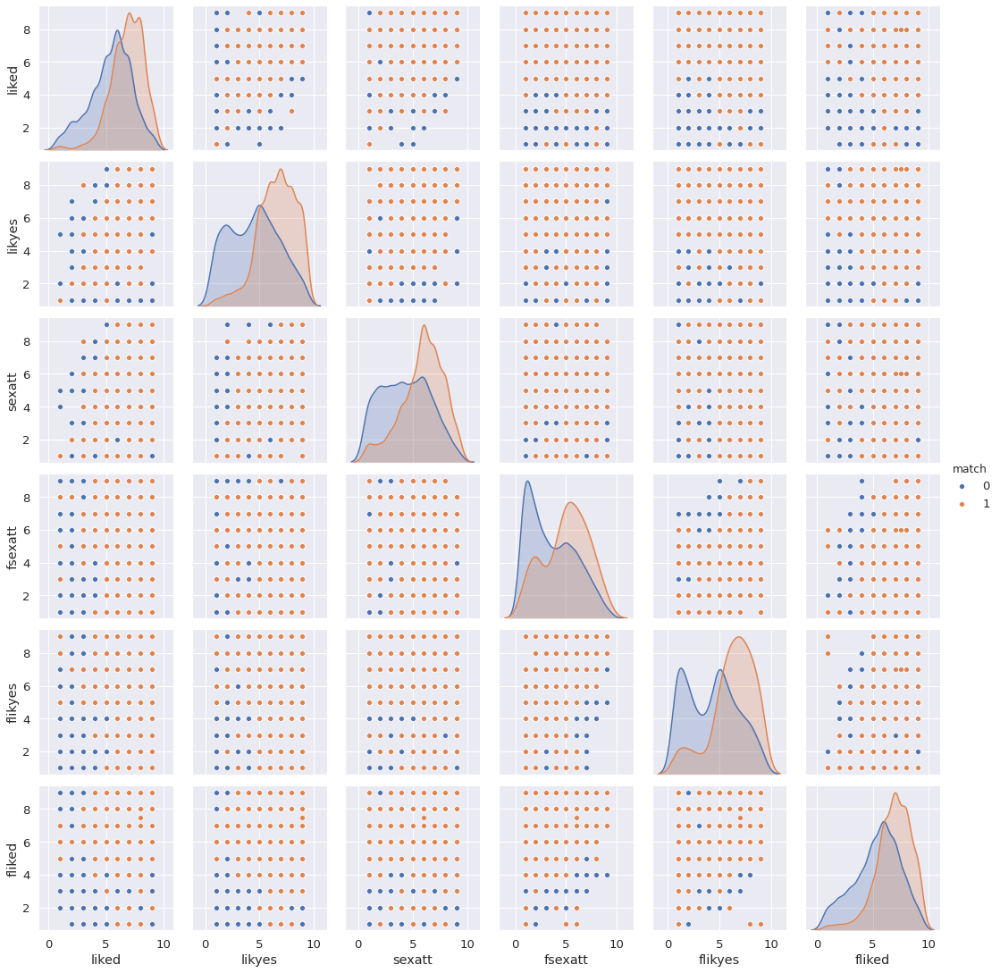

In [0]:
# Show the pair-plot
sns.set()

with sns.plotting_context("notebook", font_scale=1.2):
    sns.pairplot(raw,
                  vars=['liked',  'likyes' ,'sexatt', 'fsexatt', 'flikyes','fliked'],
                  hue ="match")

plt.show()

# Log pair plot graph

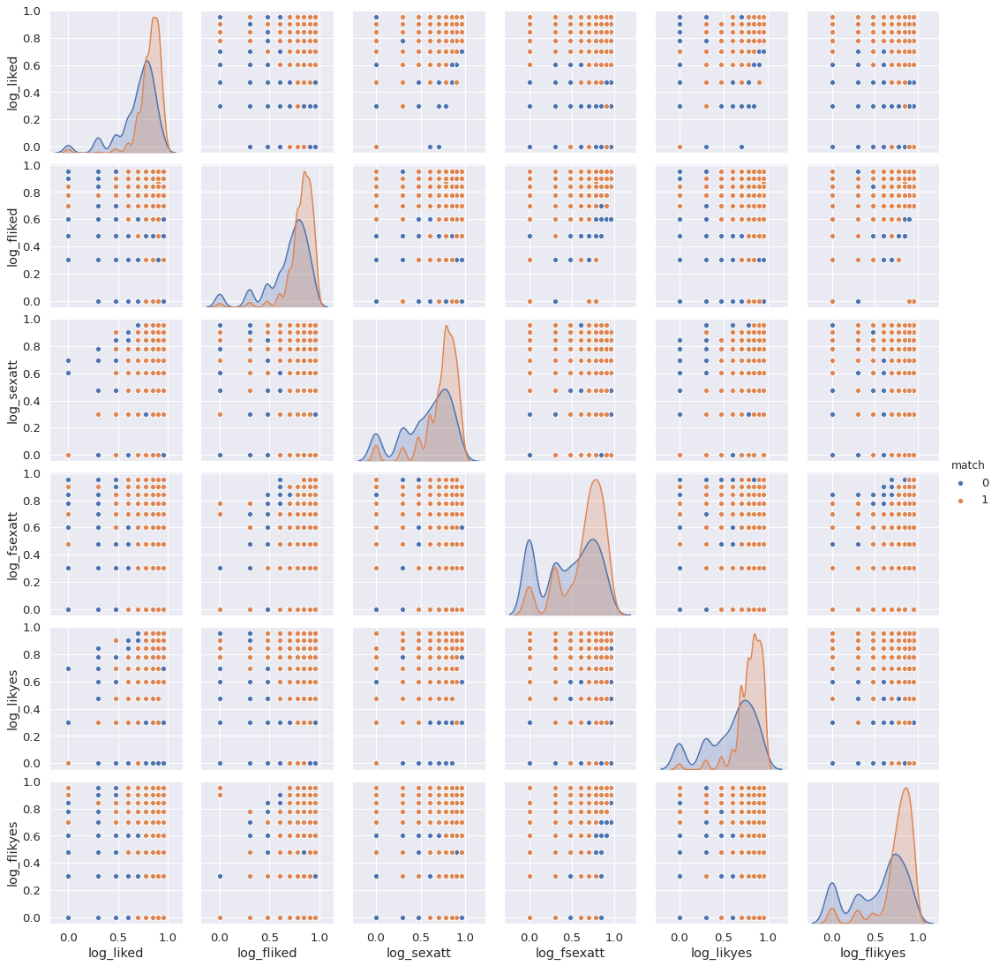

In [0]:
raw[['log_liked', 'log_fliked', 'log_sexatt', 'log_fsexatt', 'log_likyes', 'log_flikyes']] = np.log10(raw[['liked', 'fliked', 'sexatt', 'fsexatt', 'likyes', 'flikyes']])

sns.set()
with sns.plotting_context("notebook", font_scale=1.2):
    sns.pairplot(raw,
                  vars=['log_liked', 'log_fliked', 'log_sexatt', 'log_fsexatt', 'log_likyes', 'log_flikyes'],
                  hue ="match")

plt.show()

# Projection of dependent measures in 3 dimensions.
# This is to get an intuition of the desirable qualities of the participants in the study.

## Todo 
1. try different orientation for each

,fsexatt,fliked,flikyes,sexatt,liked,likyes
0,4.0,5.0,7,1.0,5.0,3.0
1,3.0,3.0,5,1.0,7.0,6.0
2,2.0,6.0,5,1.0,5.0,6.0
3,4.0,6.0,6,1.0,6.0,6.0
4,3.0,6.0,5,1.0,5.0,6.0


In [0]:
male_dm = raw[["sexatt", "liked", "likyes","saidyes","fsaidyes"]]


/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


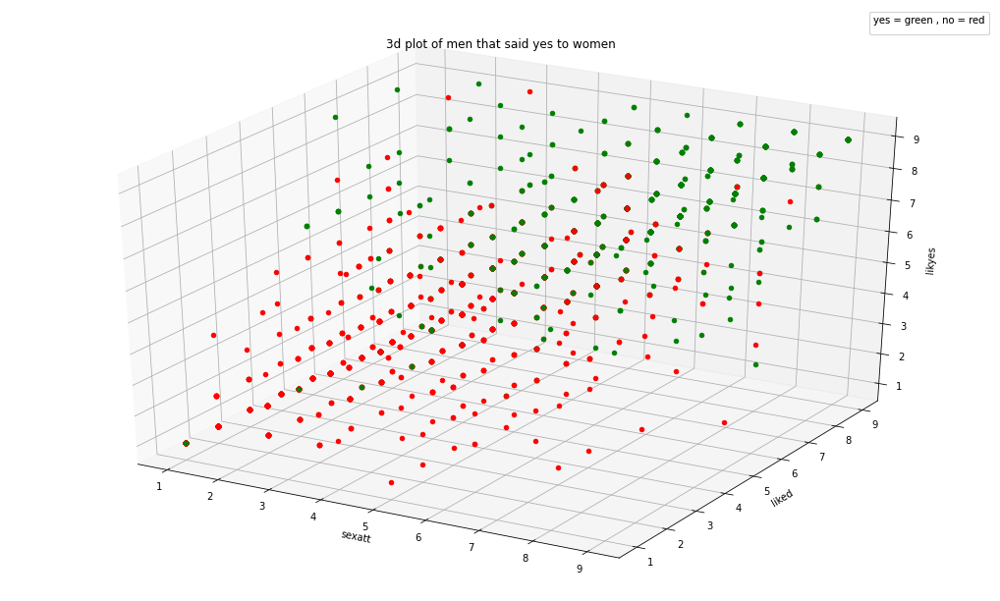

In [0]:

dm_3d(dm = ["sexatt","liked", "likyes"],target = "saidyes" , title = '3d plot of men that said yes to women')


/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


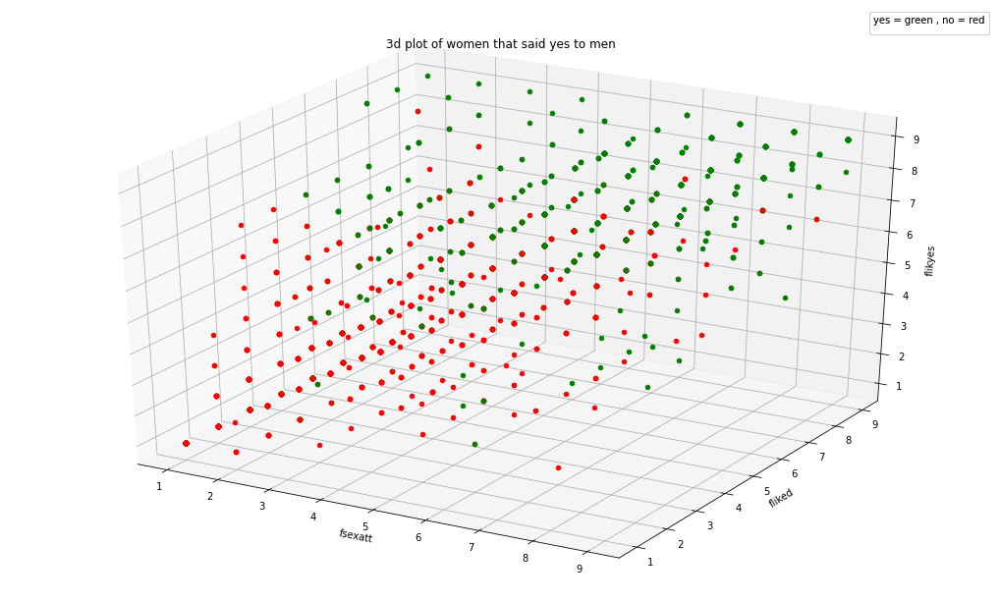

In [0]:
dm_3d(dm = ["fsexatt","fliked", "flikyes"],target = "fsaidyes" , title = '3d plot of women that said yes to men')


comments: 
  1. It looks that there exists a relationship with the women that were preceived of having high dependent and the women saying yes to the men
  2. abandon Samantha's notion of romantic desire or form a new one
    2.1 is romantic desire rdigging invented mathematical formula?
  3.

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


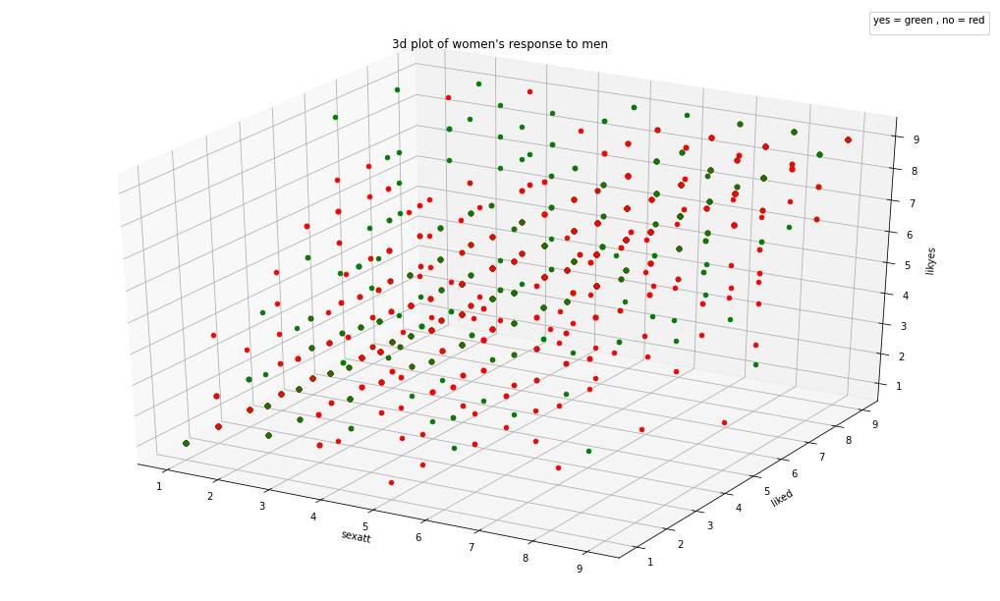

In [0]:
dm_3d(dm = ["sexatt","liked","likyes"],target = "fsaidyes" , title = '3d plot of women\'s response to men')


/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


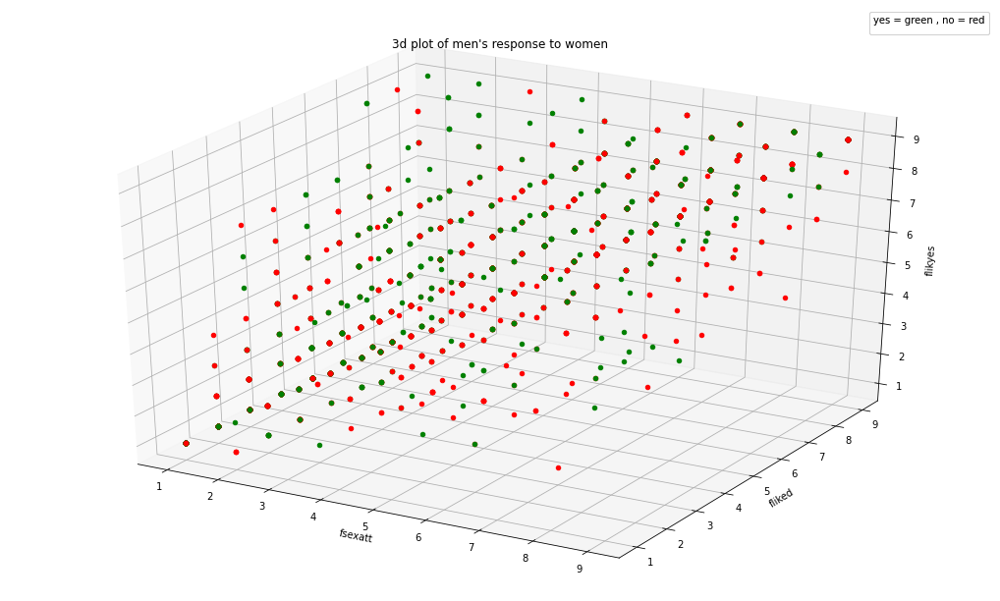

In [0]:
dm_3d(dm = ["fsexatt","fliked", "flikyes"],target = "saidyes" , title = '3d plot of men\'s response to women')


# pairwise projection in 3d

I tried diffent tsne perplexity. This is also subject to supervision. I am unsure of the right perplexity number to use, usually multiple perplexity score would have to be chosen.  And i think it's best to have an audience of people look at different preplexity scores and come up with an agree upon number. Based on reashearch i think 50 is okay, however. I rely mustly on kmeans heuaristic approach to give me proper number of clusters.

I suggest getting a professionals opinion, given the dataset we have (specifically the number of feature we have) and would be the optimal perplexity score

post questions with different orientation

In [0]:
tsne_df = tsne_data(raw_post, 3, 50)
raw[["X", "Y", "Z"]] = tsne_df

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


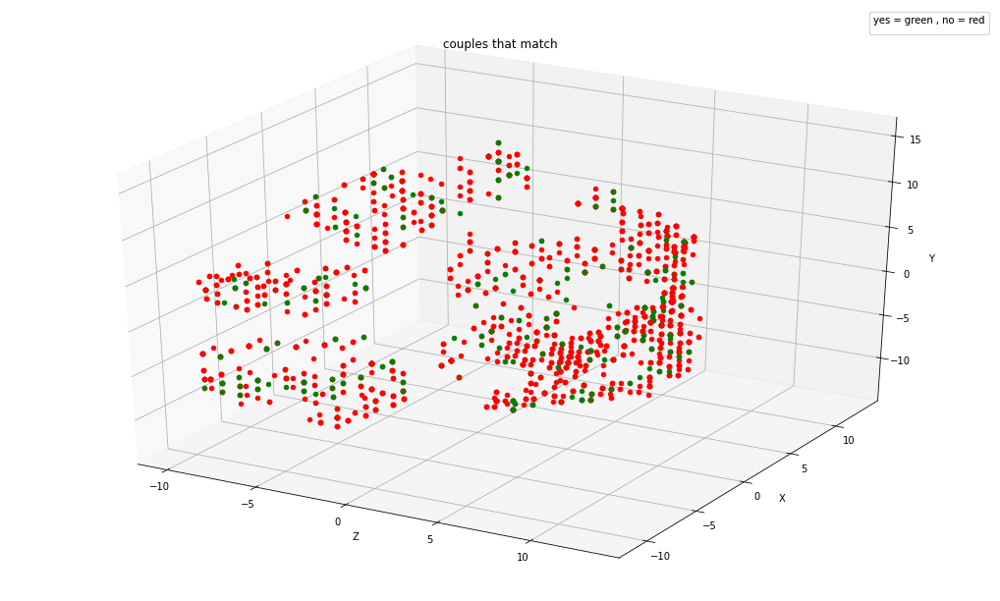

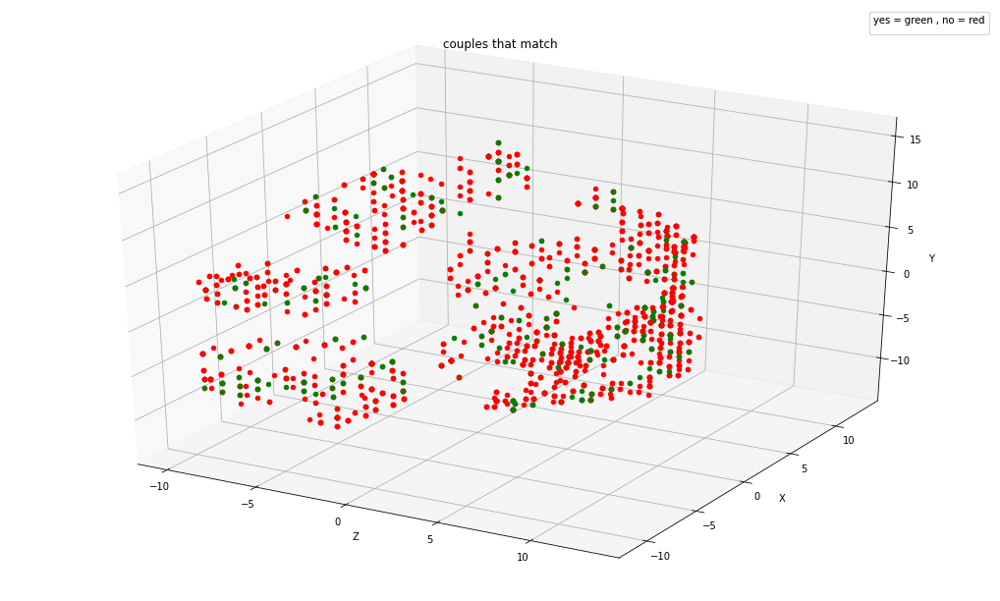

In [0]:
dm_3d(dm = ["Z","X", "Y"],target = "match" , title = 'couples that match')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


almost there


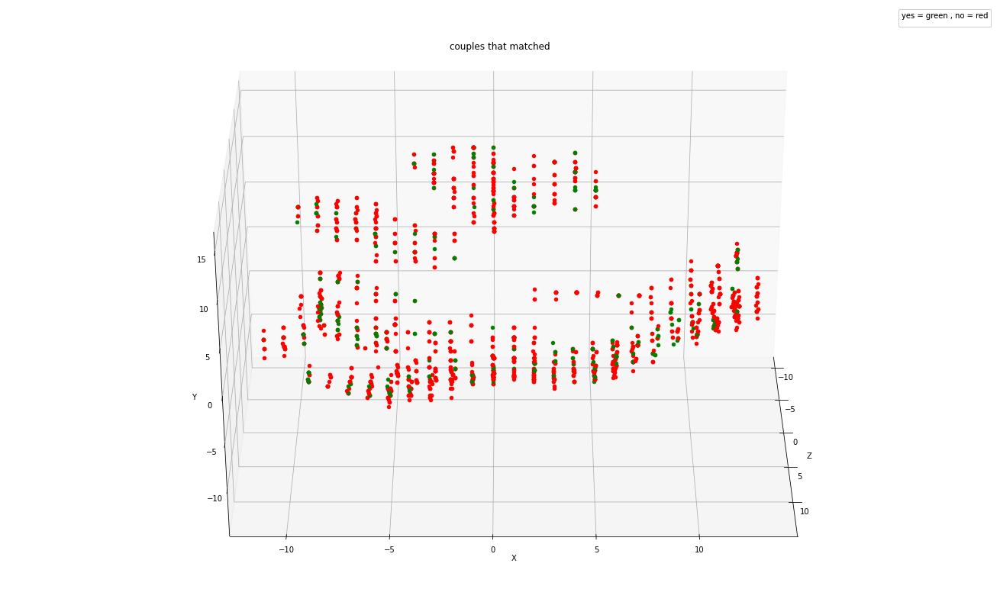

In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "match" , title = 'couples that matched')
ani.save('post couples match.gif', writer=animation.PillowWriter(fps=20))

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


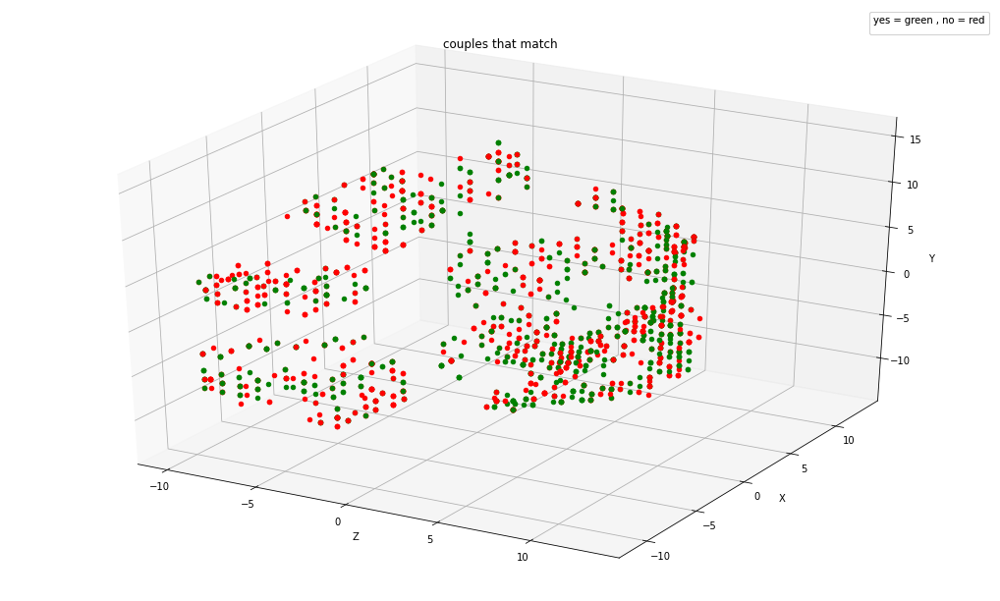

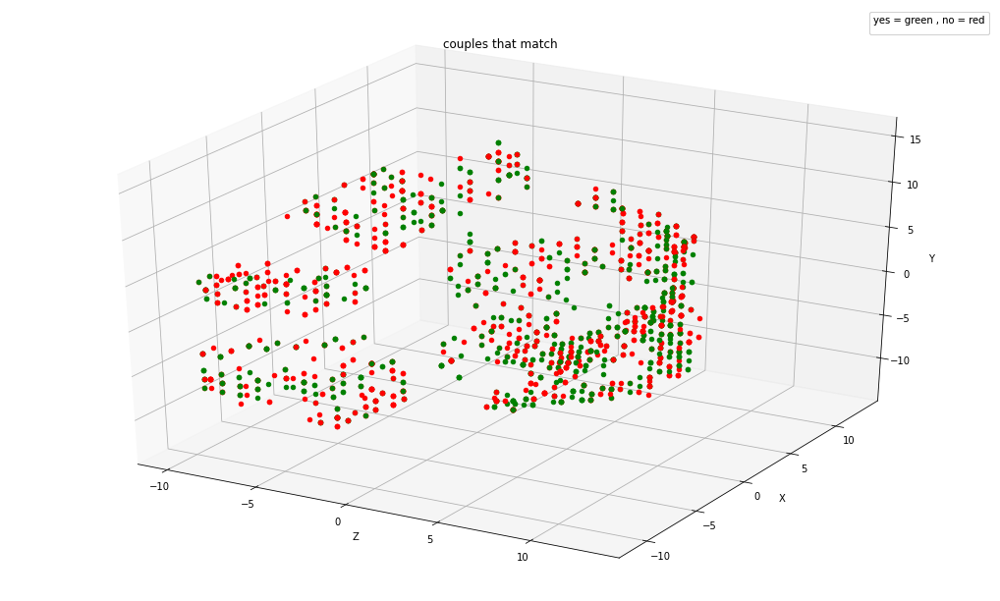

In [0]:
dm_3d(dm = ["Z","X", "Y"],target = "saidyes" , title = 'couples that match')


In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "saidyes" , title = 'couples where he said yes')
ani.save('post question he said yes.gif', writer=animation.PillowWriter(fps=20))

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


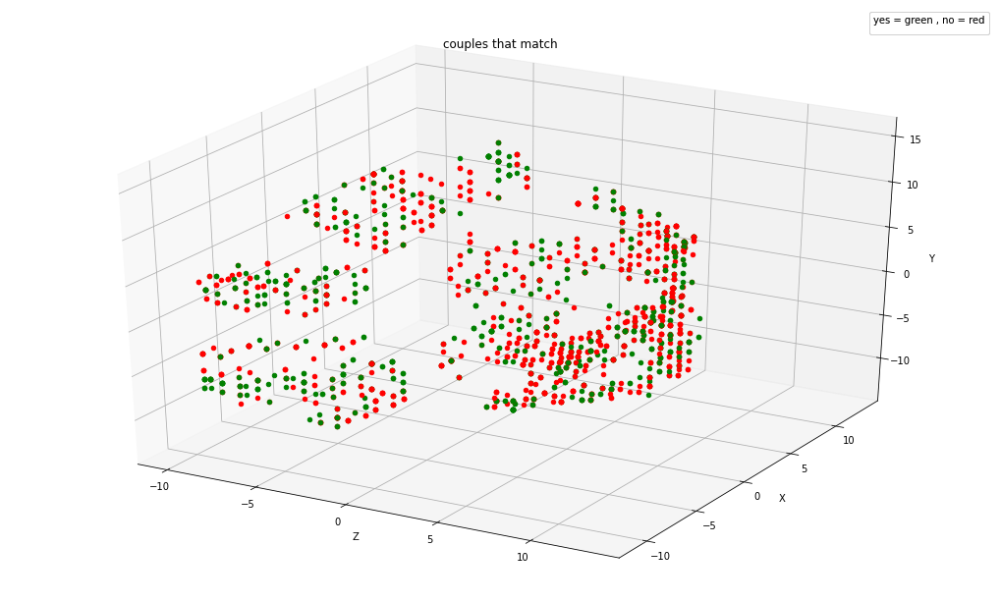

In [0]:
fig = dm_3d(dm = ["Z","X", "Y"] ,target = "fsaidyes" , title = 'couples that match')

In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "fsaidyes" , title = 'couples where she said yes')
ani.save('post she said yes.gif', writer=animation.PillowWriter(fps=20))

# I consider the below as the ground truth that i use a visual comparison to the clustered visualization

#dependent measures

In [0]:
tsne_df = tsne_data(pairwise, 3, 50)
raw[["X", "Y", "Z"]] = tsne_df

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


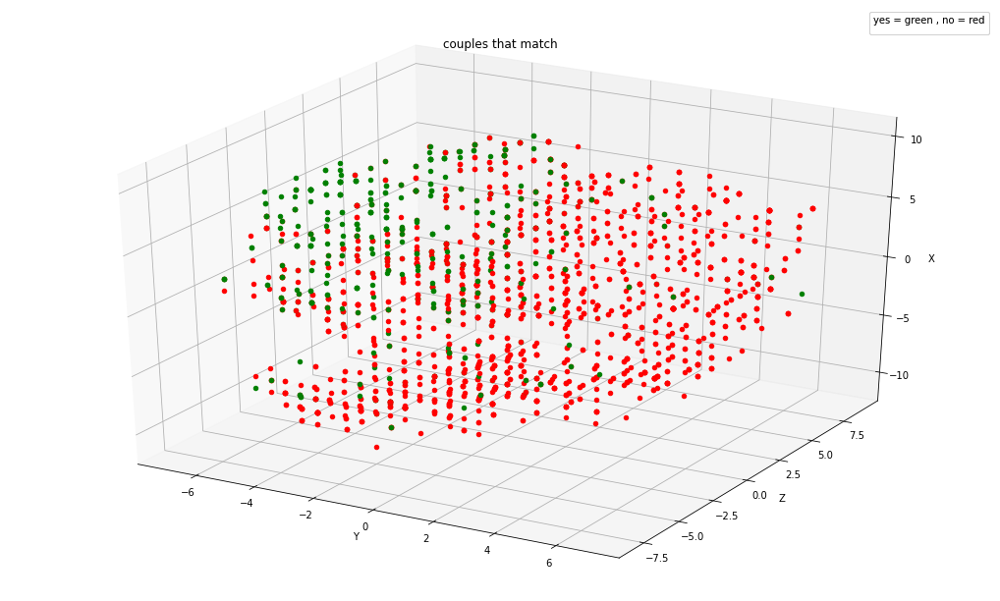

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "match" , title = 'couples that match')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


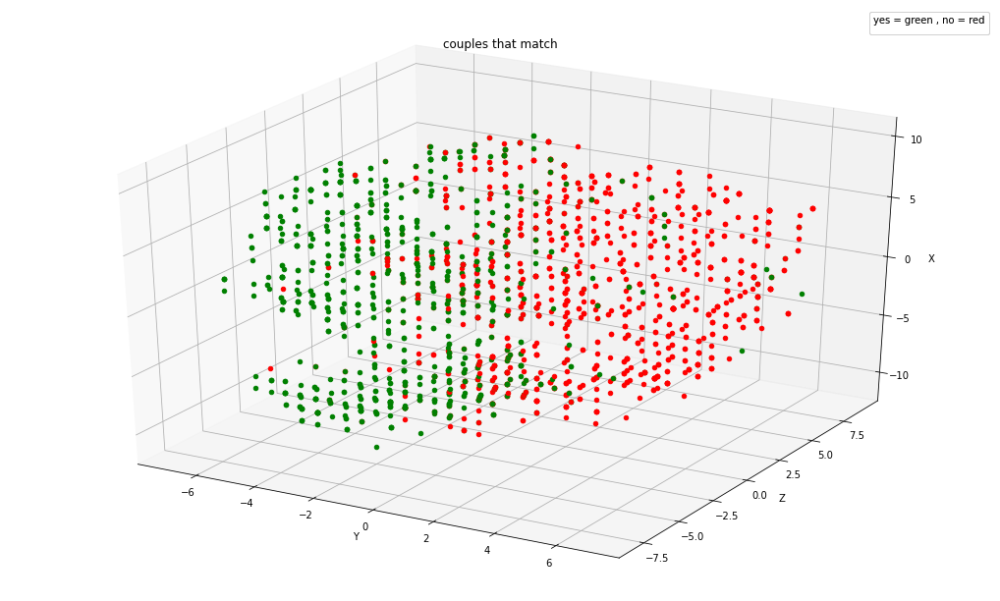

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "saidyes" , title = 'couples that match')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


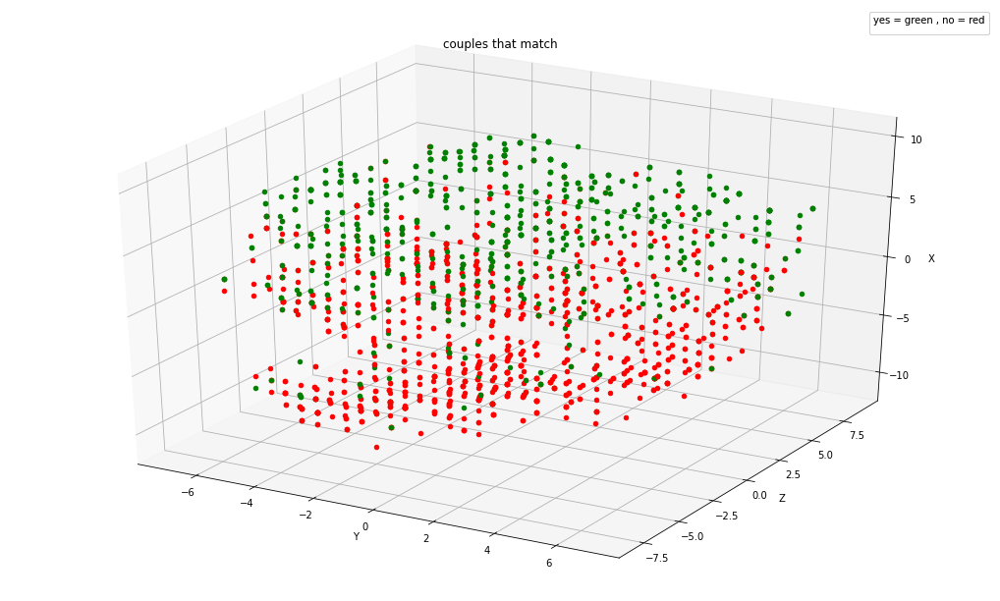

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "fsaidyes" , title = 'couples that match')

#male features post

In [0]:
raw[male_features]
tsne_df = tsne_data(raw[male_features], 3, 50)
raw[["X", "Y", "Z"]] = tsne_df

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


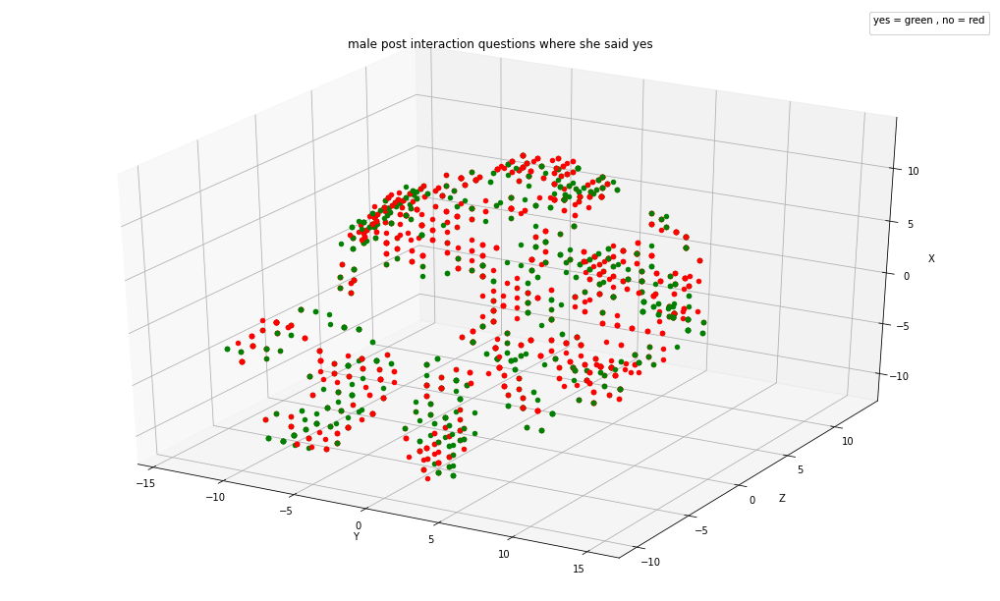

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "fsaidyes" , title = 'male post interaction questions where she said yes')

In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "fsaidyes" , title = 'male post interaction questions where she said yes')
ani.save('male post interaction questions where she said yes.gif', writer=animation.PillowWriter(fps=20))

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


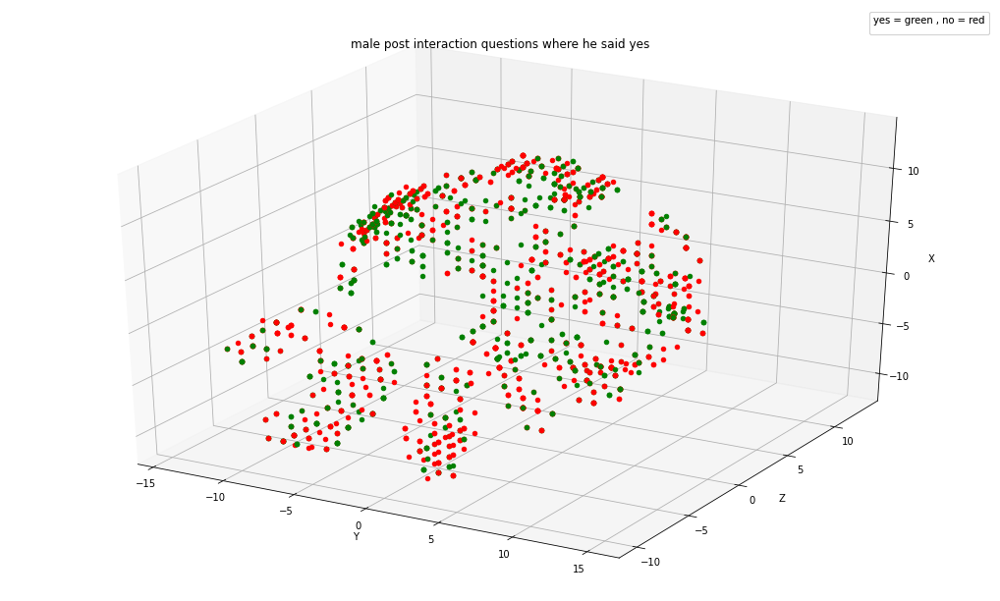

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "saidyes" , title = 'male post interaction questions where he said yes')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


almost there


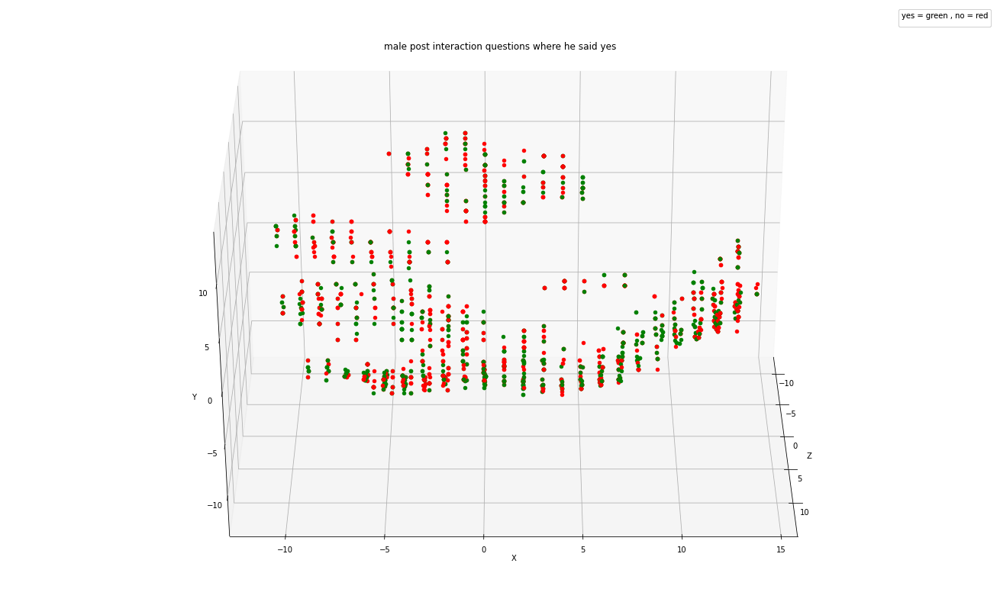

In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "saidyes" , title = 'male post interaction questions where he said yes')
ani.save('male post interaction questions where he said yes.gif', writer=animation.PillowWriter(fps=20))

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


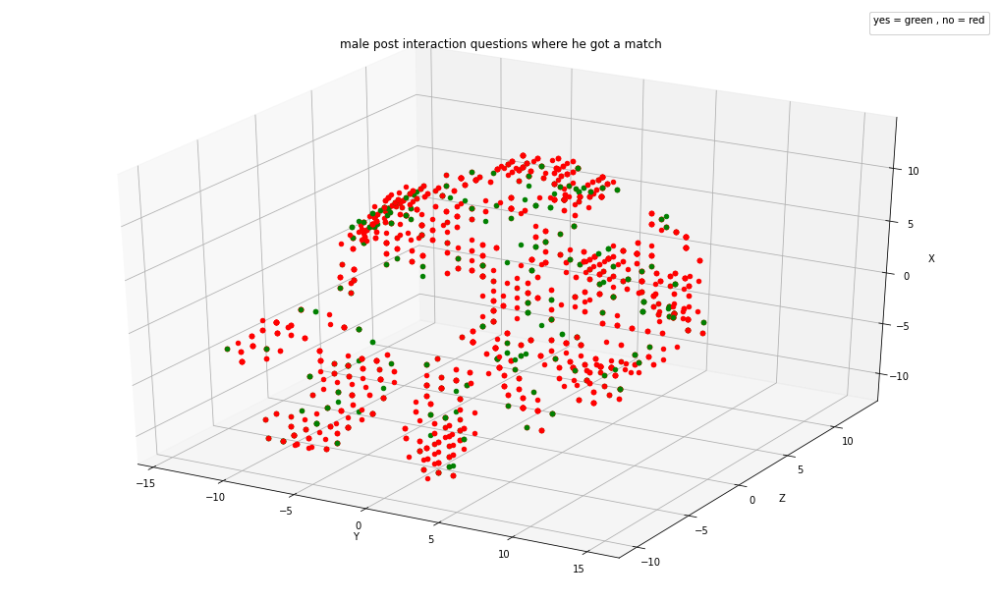

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "match" , title = 'male post interaction questions where he got a match')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


almost there


KeyboardInterrupt: ignored

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7f61b1b431e0> (for post_execute):


KeyboardInterrupt: ignored

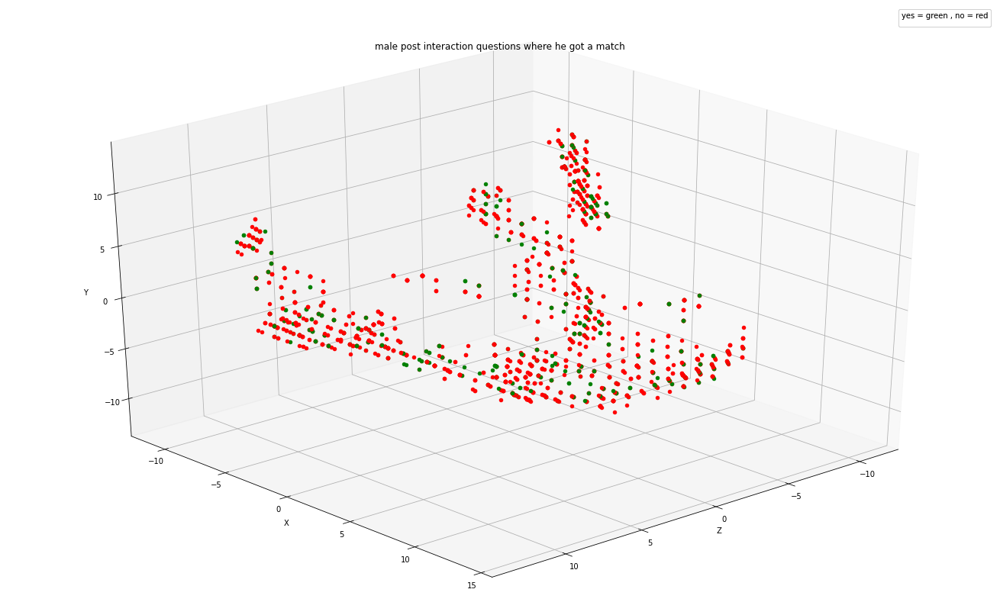

In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "match" , title = 'male post interaction questions where he got a match')
ani.save('male post interaction questions where he got a match.gif', writer=animation.PillowWriter(fps=20))

# female features post

In [0]:
raw[female_features]
tsne_df = tsne_data(raw[female_features], 3, 50)
raw[["X", "Y", "Z"]] = tsne_df

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "fsaidyes" , title = 'female post interaction questions where she said yes')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


almost there


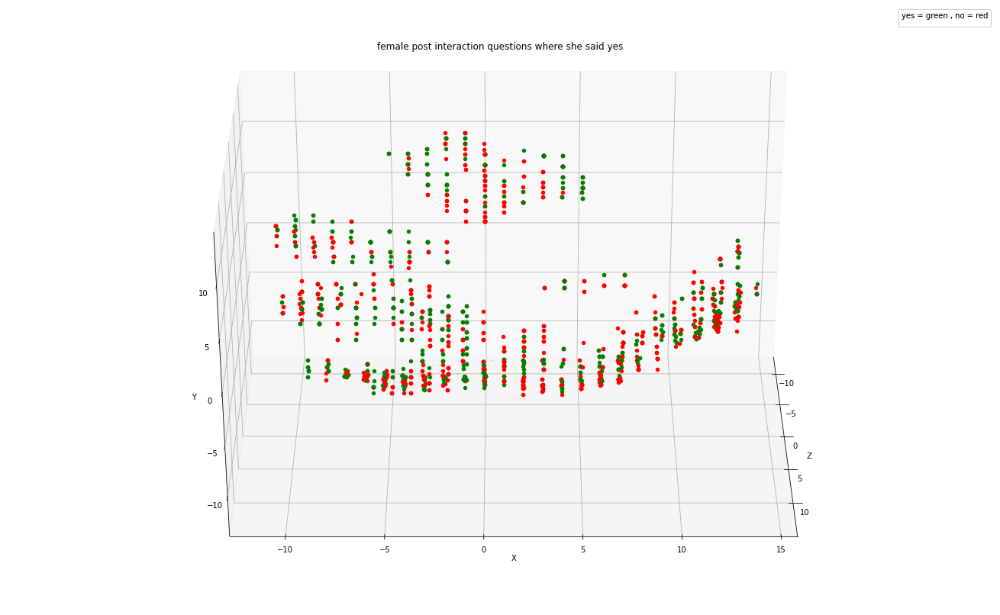

In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "fsaidyes" , title = 'female post interaction questions where she said yes')
ani.save('female post interaction questions where she said yes.gif', writer=animation.PillowWriter(fps=20))

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


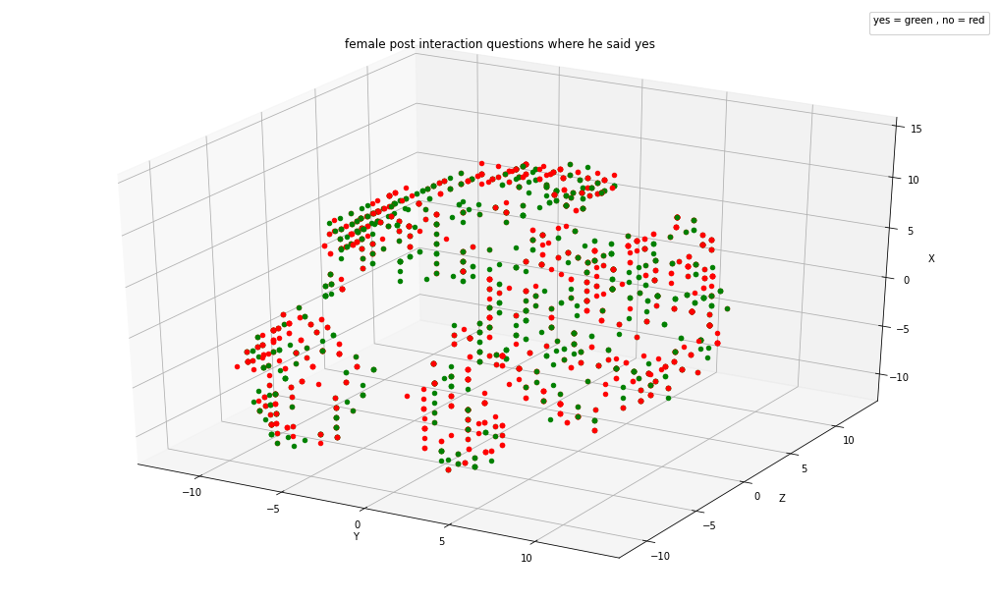

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "saidyes" , title = 'female post interaction questions where he said yes')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


almost there


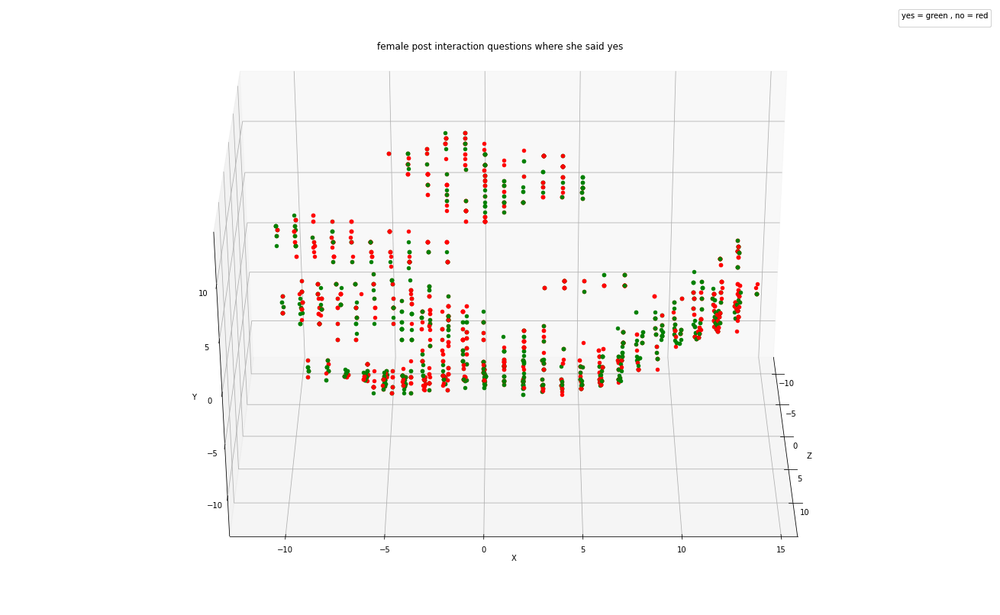

In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "saidyes" , title = 'female post interaction questions where she said yes')
ani.save('female post interaction questions where he said yes.gif', writer=animation.PillowWriter(fps=20))

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


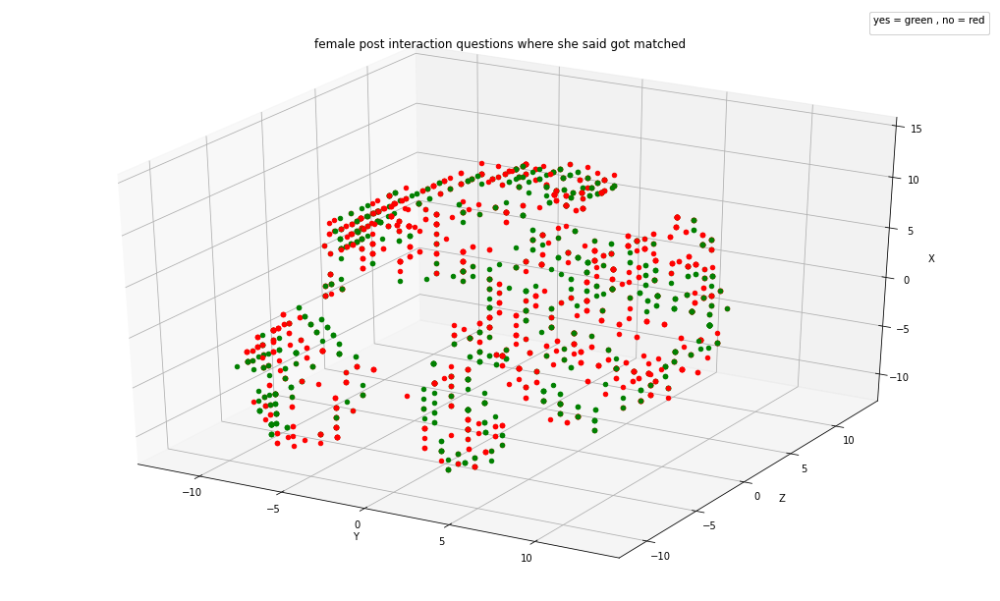

In [0]:
dm_3d(dm = ["Y","Z", "X"],target = "fsaidyes" , title = 'female post interaction questions where she said got matched')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


almost there


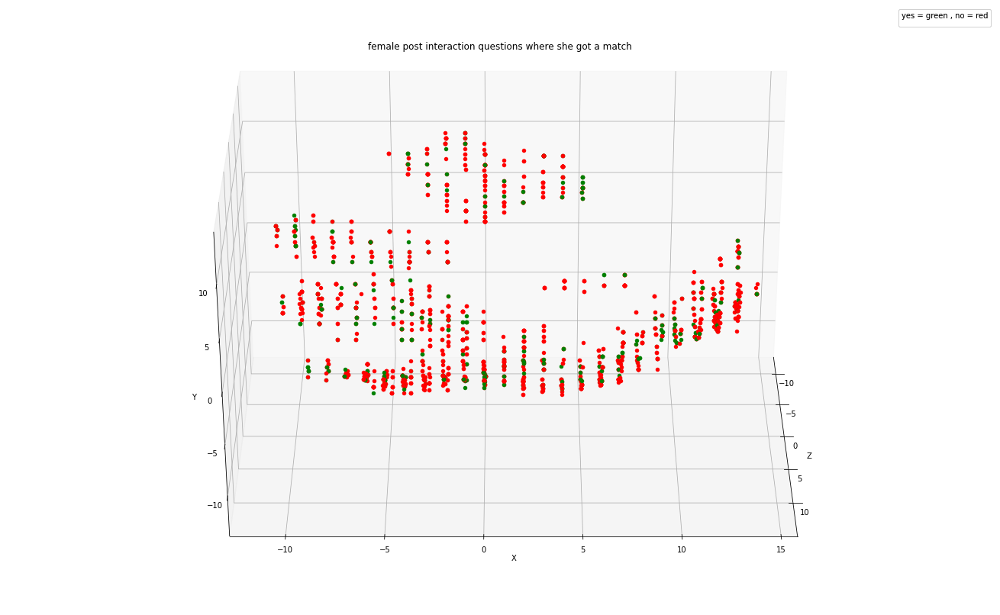

In [0]:
fig,ani = rotate_3d(dm = ["Z","X", "Y"] ,target = "match" , title = 'female post interaction questions where she got a match')
ani.save('female post interaction questions where she got a match.gif', writer=animation.PillowWriter(fps=20))

#Project data into 2 dimensional space

Pairwise dependent measures

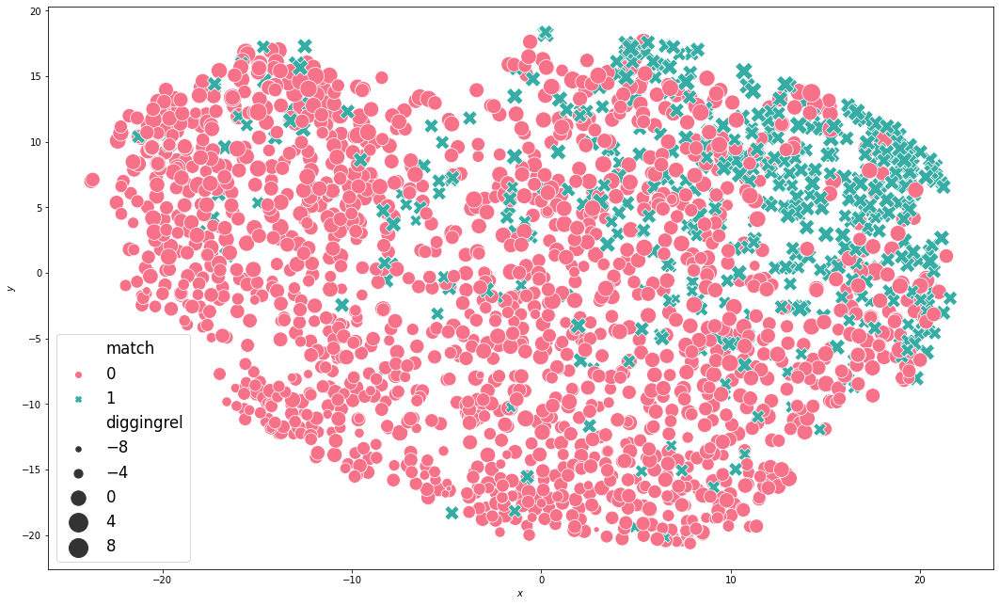

In [0]:
pairwise = raw[["fsexatt","fliked", "flikyes","sexatt","liked", "likyes"]]

raw_tsne  = tsne_data(pairwise, 2, 100)
dff_pick = pd.concat([raw_measures, raw_tsne], axis=1)
plot(dff_pick,'match','diggingrel', "match")

In [0]:
sddf = dff_pick[(dff_pick.match == 1)]


In [0]:
sddf.describe()

,maleid,femaleid,dateorder,fdateorder,liked,sexatt,likyes,fliked,fsexatt,flikyes,saidyes,fsaidyes,match,diggingactorgm,fdiggingactorgm,diggingpartner,fdiggingpartner,diggingrel,fdiggingrel,x,y
count,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.0,444.0,444.0,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000
mean,324.094595,217.707207,6.364865,6.407658,6.867117,5.912162,6.632883,6.886261,5.058559,6.344595,1.0,1.0,1.0,0.257632,0.151928,5.603735,5.275334,0.630983,0.669330,9.099127,4.859861
std,152.827866,142.520554,3.439543,3.437679,1.413543,1.909684,1.764434,1.562473,2.177495,2.076569,0.0,0.0,0.0,0.864525,0.901117,1.105657,1.228325,1.214755,1.308193,9.677291,7.502819
min,15.000000,7.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.0,-2.640000,-2.090000,3.055556,1.848485,-3.201087,-3.270000,-21.267239,-20.224575
25%,230.250000,79.750000,3.000000,3.000000,6.000000,5.000000,6.000000,6.000000,4.000000,5.000000,1.0,1.0,1.0,-0.164134,-0.482144,4.851852,4.358974,-0.205452,-0.172500,4.612928,0.286755
50%,311.000000,244.000000,6.000000,6.000000,7.000000,6.000000,7.000000,7.000000,5.000000,7.000000,1.0,1.0,1.0,0.280000,0.210000,5.655000,5.128205,0.574554,0.652621,11.207542,6.124442
75%,419.500000,341.000000,9.000000,9.000000,8.000000,7.000000,8.000000,8.000000,7.000000,8.000000,1.0,1.0,1.0,0.890000,0.844758,6.432500,6.260000,1.429887,1.596161,16.842758,10.030046
max,708.000000,660.000000,13.000000,13.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,1.0,1.0,1.0,2.280000,2.650313,7.805556,7.910000,3.759869,4.503727,21.589899,18.366137


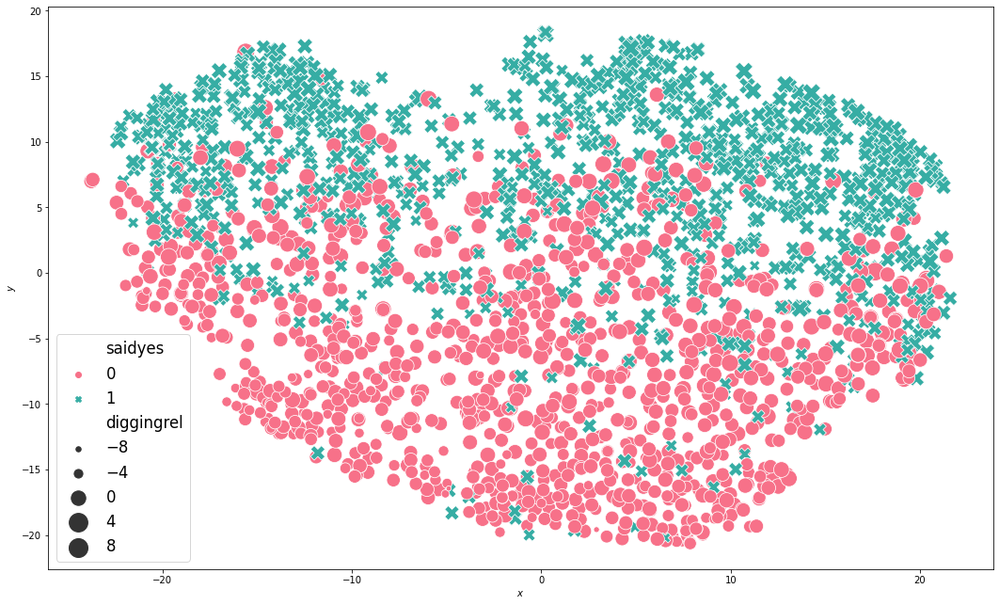

In [0]:
plot(dff_pick,'saidyes','diggingrel', "saidyes")

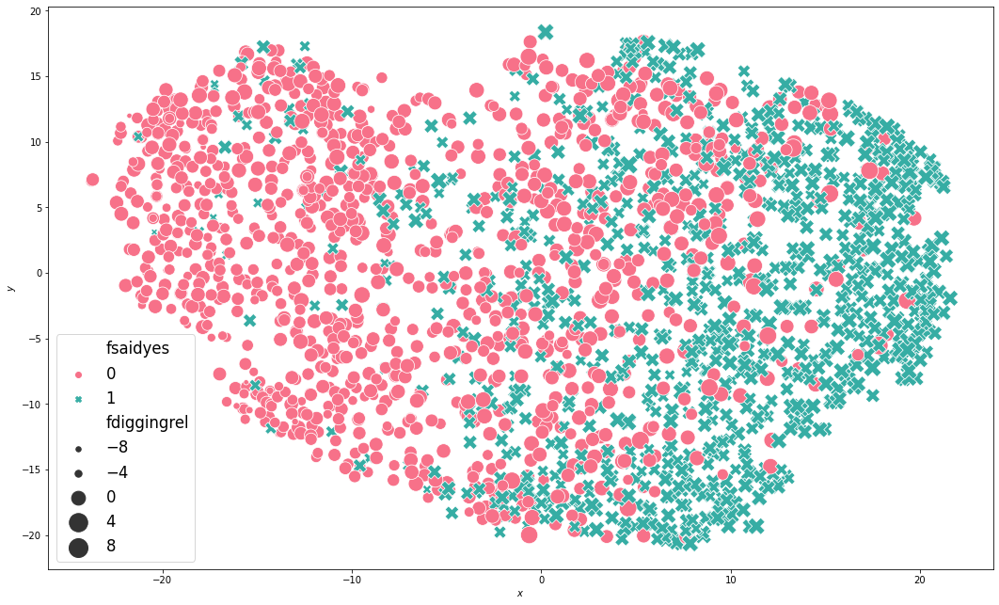

In [0]:
plot(dff_pick,'fsaidyes','fdiggingrel', "fsaidyes")

Statistcal description of the interesting insights

median data

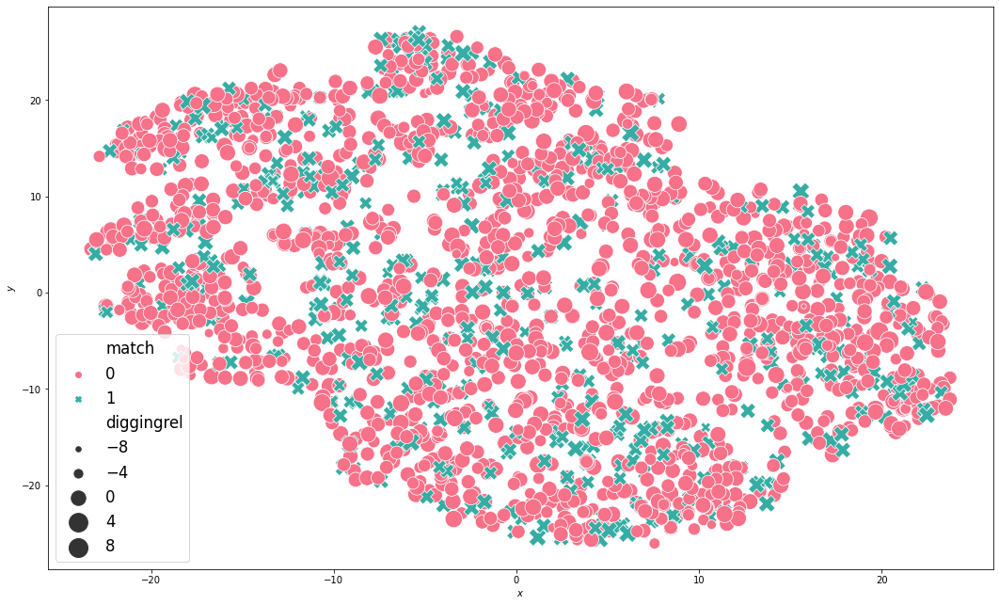

In [0]:
raw_tsne  = tsne_data(pairwise2, 2, 100)
dff_pick3 = pd.concat([raw_measures, raw_tsne], axis=1)
plot(dff_pick3,'match','diggingrel', "match")

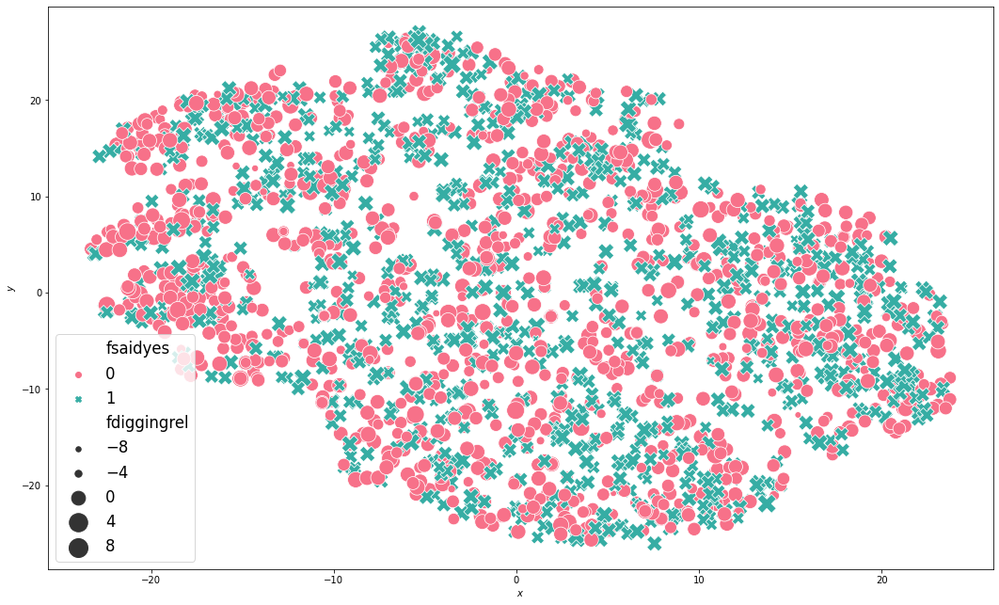

In [0]:
plot(dff_pick3,'fsaidyes','fdiggingrel', "fsaidyes")

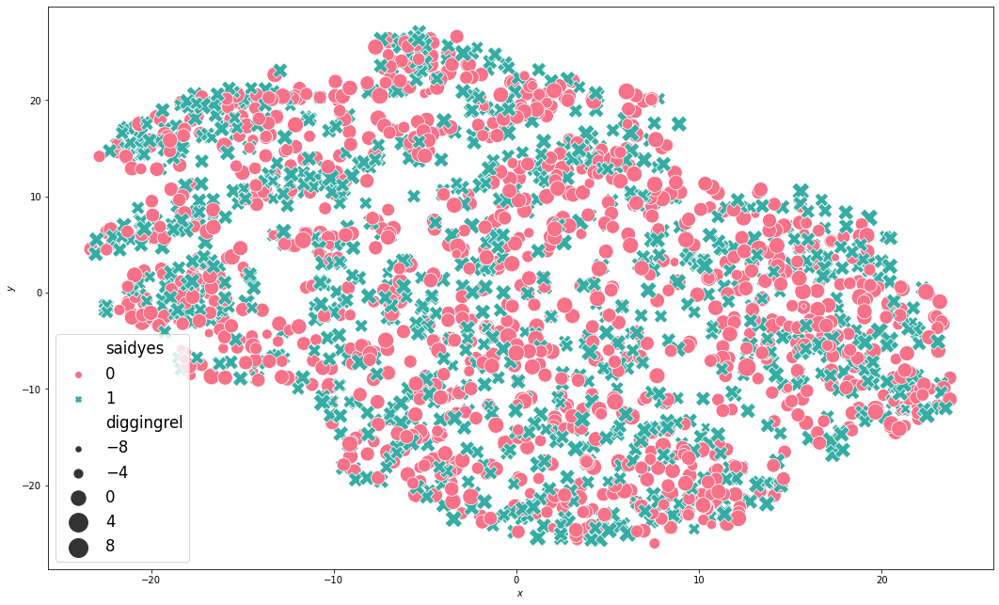

In [0]:
plot(dff_pick3,'saidyes','diggingrel', "saidyes")

##post interaction data
preplexity 50

comment:
with this i may end up with multiple clusters

In [0]:
raw_post.shape

(2050, 66)

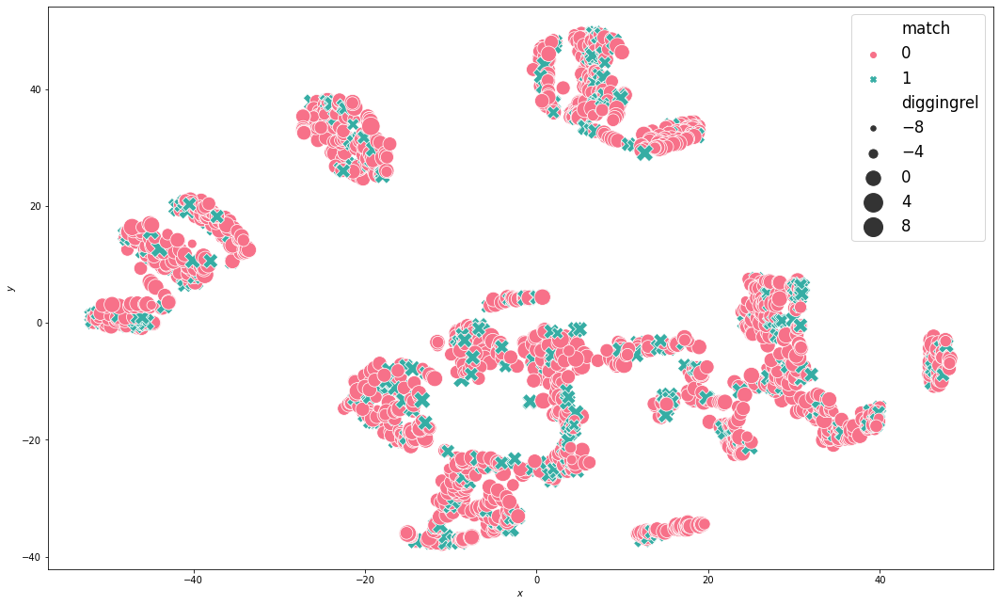

In [0]:
raw_tsne  = tsne_data(raw_post, 2, 50)
dff = pd.concat([raw_measures, raw_tsne], axis=1)
plot(dff,'match','diggingrel', 'match')


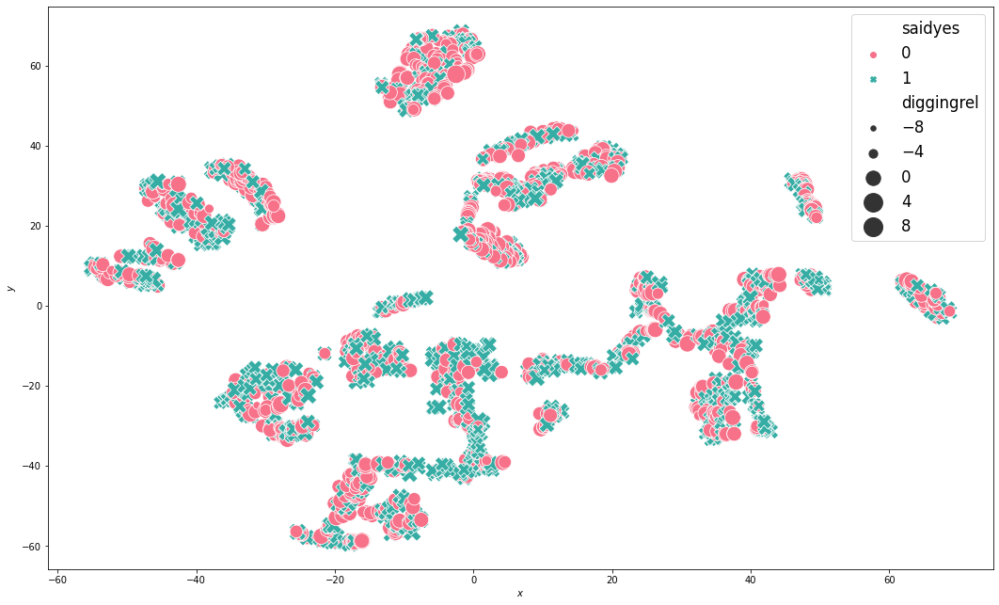

In [0]:
plot(dff,'saidyes','diggingrel', 'saidyes')

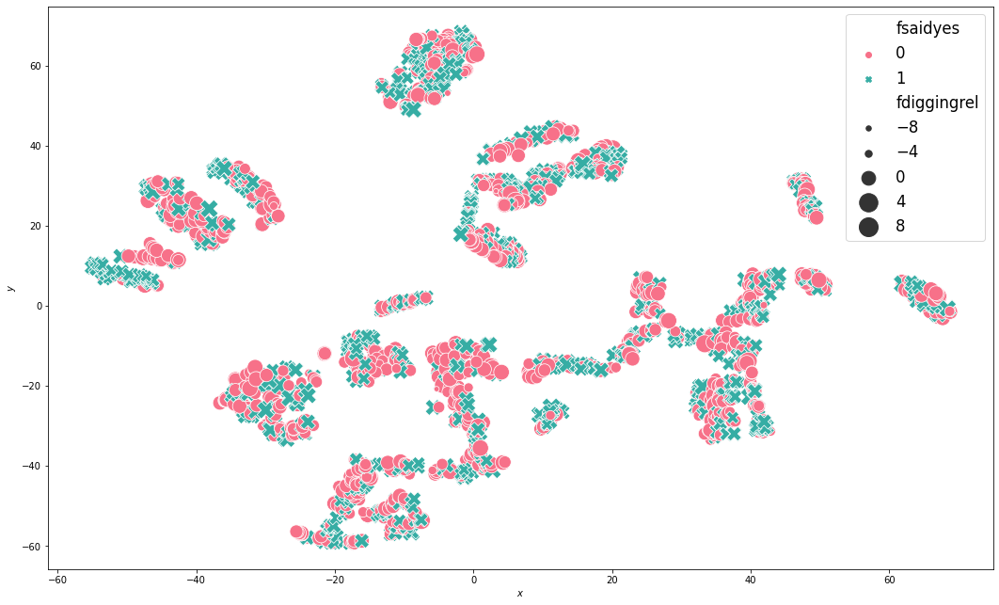

In [0]:
plot(dff,'fsaidyes','fdiggingrel', 'fsaidyes')

# median approach (not confident in this)

median post questions

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


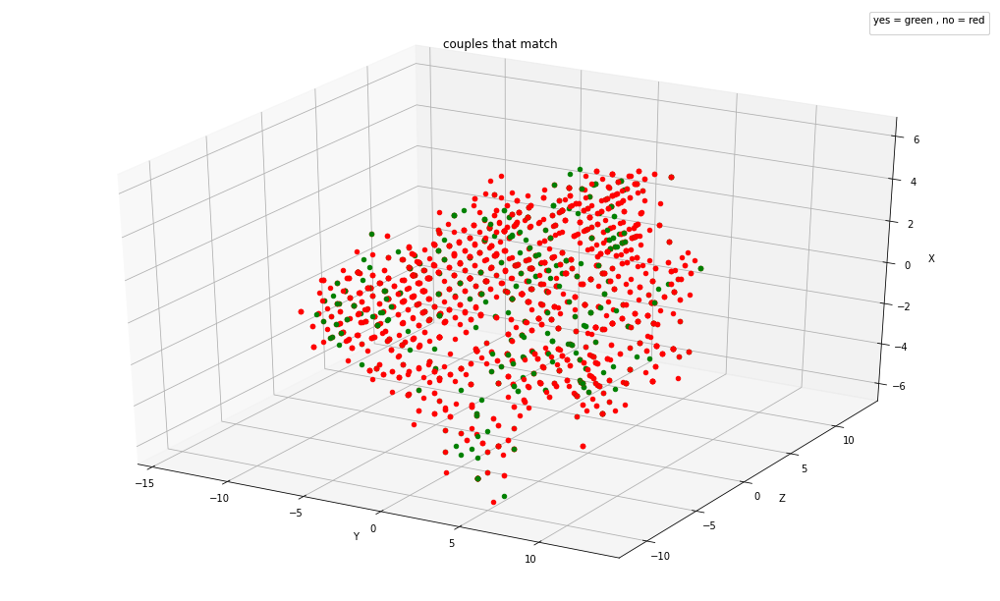

In [0]:
tsne_df = tsne_data(pairwise2, 3, 50)
raw[["X", "Y", "Z"]] = tsne_df
dm_3d(dm = ["Y","Z", "X"],target = "match" , title = 'couples that match')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


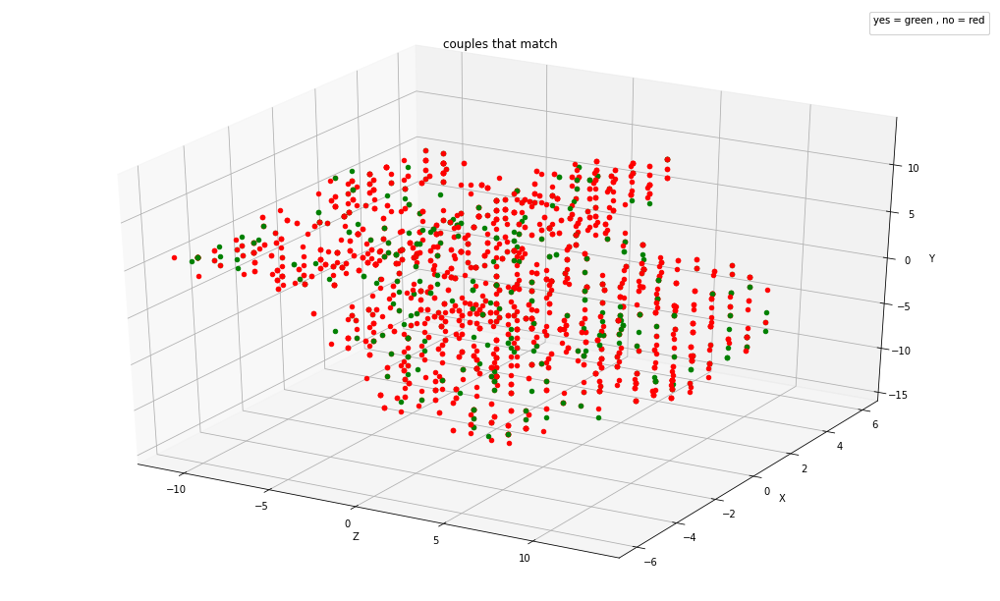

In [0]:
dm_3d(dm = ["Z","X", "Y"],target = "match" , title = 'couples that match')

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:989: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


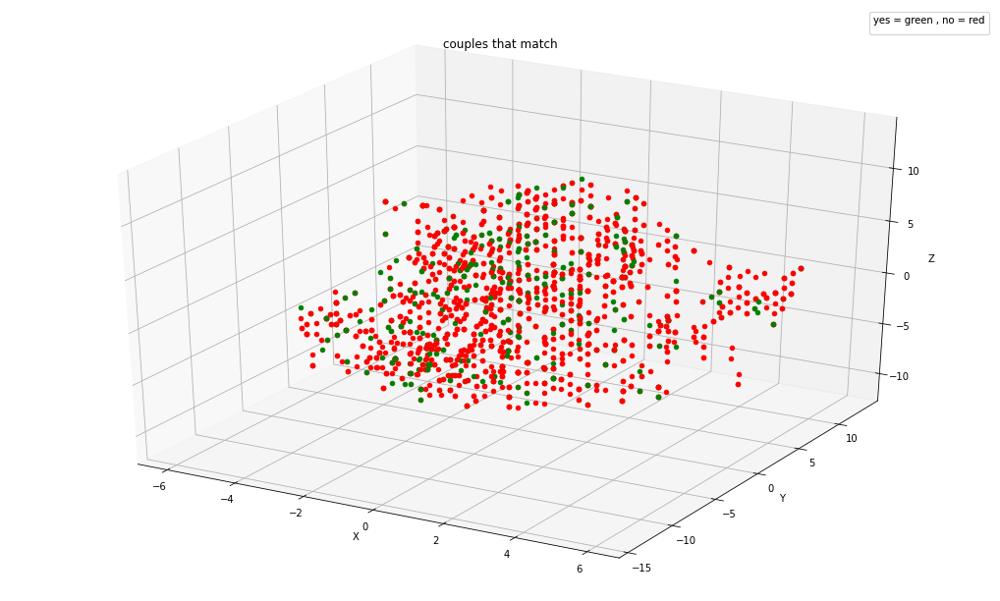

In [0]:
dm_3d(dm = ["X","Y", "Z"],target = "match" , title = 'couples that match')

#Todo
1. Look out for the amount of concentration  matches in the bigger cluster


In [0]:
def plot(dff, hue = None ,size = None , style = None):
  fig, ax = plt.subplots(figsize=(18, 11))
  with sns.plotting_context("notebook", font_scale=1.5):
      sns.scatterplot(x ='x',
                      y ='y',
                      hue = hue,
                      size = size,
                      style = style,
                      sizes =(30, 400),
                      palette=sns.color_palette("husl", 2),
                      data=dff,
                      ax=ax)
  ax.set_xlabel(r'$x$')
  ax.set_ylabel(r'$y$')
  plt.show()

  

# Cluster Analysis on post pairs and dm pairs
I decided to use kmeans. 
I suspect Gaussian mixtures would be better, but i am not confident in it's methodology yet

dependent measures pairwise

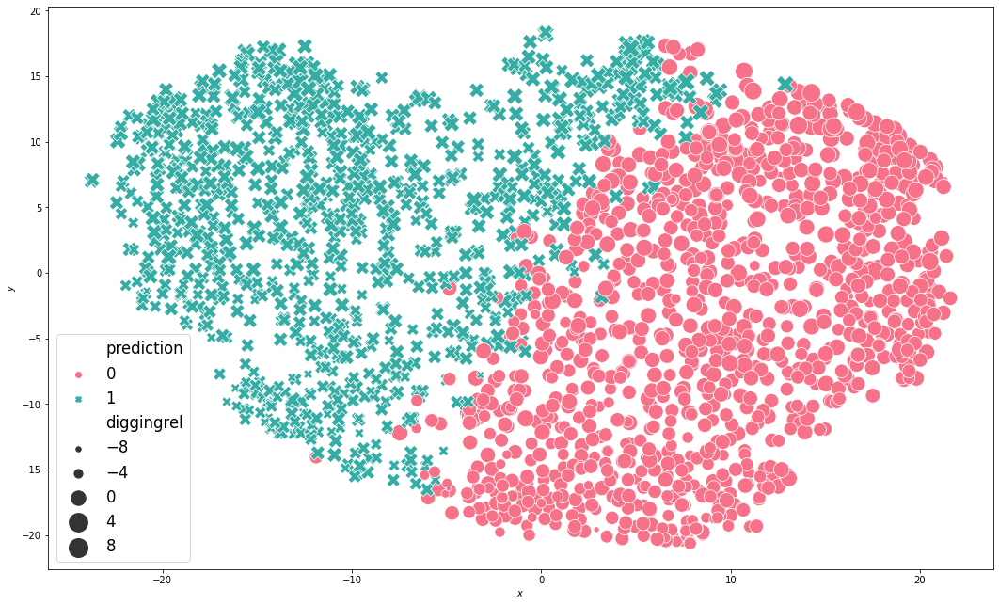

In [0]:
pairwise = raw[["fsexatt","fliked", "flikyes","sexatt","liked", "likyes"]]

km = KMeans(n_clusters = 2, max_iter=1000, random_state=1000)
Y_pred = km.fit_predict(pairwise)

df_km = pd.DataFrame(Y_pred, columns=['prediction'], index=raw.index)
kmdff = pd.concat([dff_pick, df_km], axis=1)
plot(kmdff,'prediction','diggingrel', 'prediction')


postquestions pairwise

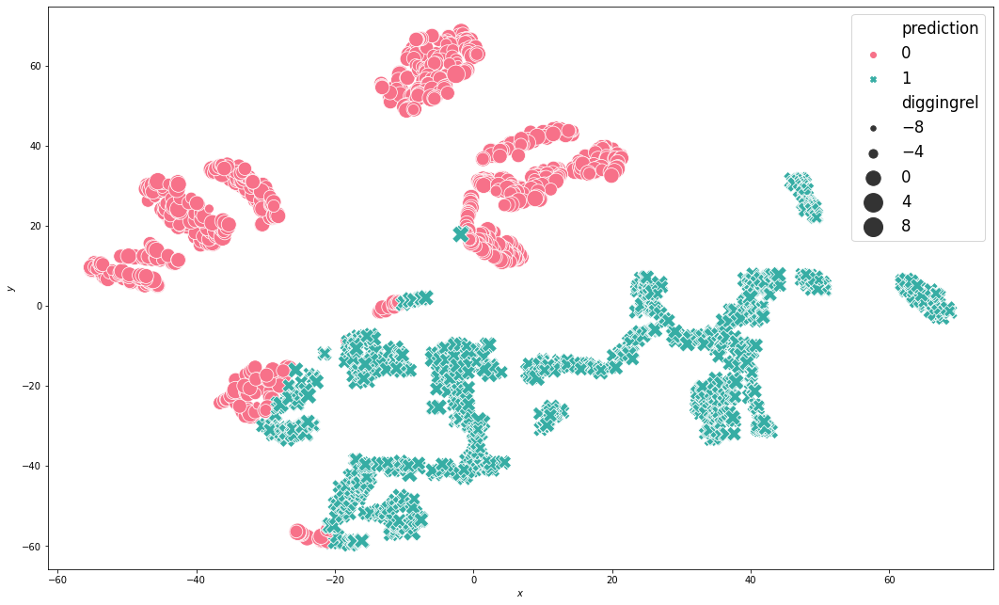

In [0]:
km = KMeans(n_clusters = 2, max_iter=10000, random_state=1000)
Y_pred = km.fit_predict(raw_post)

df_km = pd.DataFrame(Y_pred, columns=['prediction'], index=raw.index)
kmdff = pd.concat([dff, df_km], axis=1)

# Perform a K-Means clustering with K=2
# Show the clustering result
plot(kmdff,'prediction','diggingrel', 'prediction', num = 2)



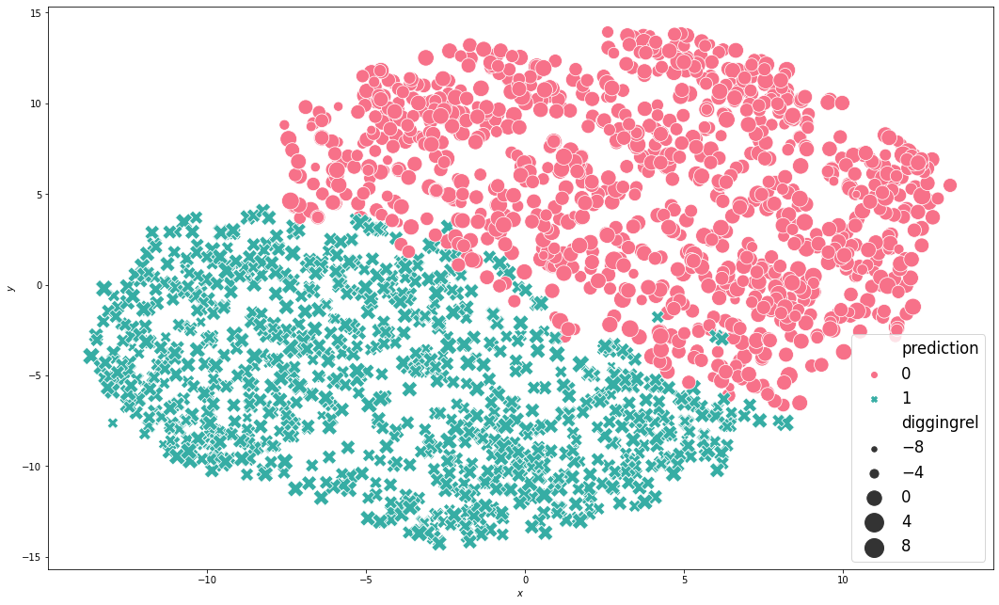

In [0]:
km = KMeans(n_clusters = 2, max_iter=10000, random_state=1000)
Y_pred = km.fit_predict(pairwise2)

df_km = pd.DataFrame(Y_pred, columns=['prediction'], index=raw.index)
kmdff = pd.concat([dff_pick3, df_km], axis=1)

# Perform a K-Means clustering with K=2
# Show the clustering result
fig, ax = plt.subplots(figsize=(18, 11))

with sns.plotting_context("notebook", font_scale=1.5):
    sns.scatterplot(x='x',
                    y='y',
                    hue='prediction',
                    size='diggingrel',
                    style ='prediction',
                    sizes=(30, 400),
                    palette=sns.color_palette("husl", 2),
                    data=kmdff,
                    ax=ax)
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()




From observation our cluster algorithm doesn't seem to be able to capture our
the 2 sets of matched and unmatched.  one of the reasons i suspects for this behaviour is that way more people unmatched than matched than matched. 440 vs 1610 
The next thing to do is to see if we can find even smaller cluster that may give us more insight to the data.
For this i would have to use a metric to determine the optimal number of clusters

# Finding the optimal number of clusters
# for each dataset




pairwise dependent measures

In [0]:

def get_inertias(df):
  inertias = []
  for i in range(2, 30):
      km = KMeans(n_clusters=i, max_iter=1000, random_state=1000)
      km.fit(df)
      inertias.append(km.inertia_)
  return inertias
# Show the plot inertia vs. no. clusters
def plot_inertia_vs_noclusters(inertias, title):
  fig, ax = plt.subplots(figsize=(18, 8))
  ax.plot(np.arange(2, 30, 1), inertias)
  ax.set_xlabel('Number of clusters', fontsize=14)
  ax.set_ylabel('Inertia', fontsize=14)
  ax.set_title(title)
  ax.set_xticks(np.arange(2, 30, 2))
  fig.patch.set_facecolor('xkcd:mint green')
  plt.show()


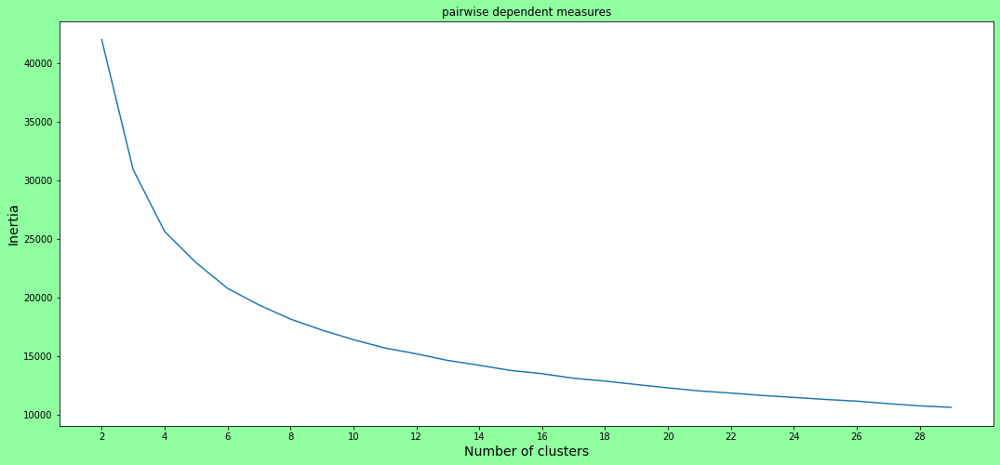

In [0]:
inertias = get_inertias(pairwise)
plot_inertia_vs_noclusters(inertias, "pairwise dependent measures")
  

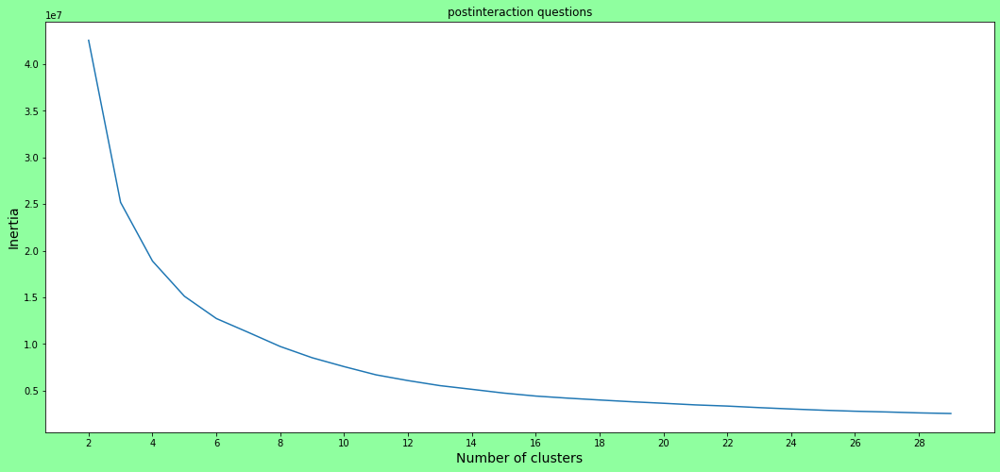

In [0]:
inertias = get_inertias(raw_post)
plot_inertia_vs_noclusters(inertias, "postinteraction questions")
  

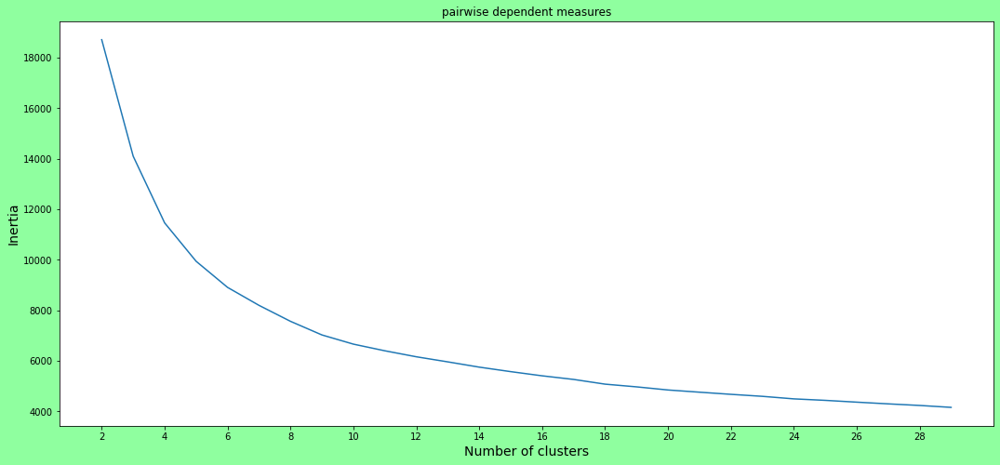

In [0]:
inertias = get_inertias(pairwise2)
plot_inertia_vs_noclusters(inertias, "pairwise dependent measures")
  

# Visual representation of the cluster
(I could have well done 7 or 8 clusters as opposed to 6)

From the above it seems to be that optmal number if clusters is 6.

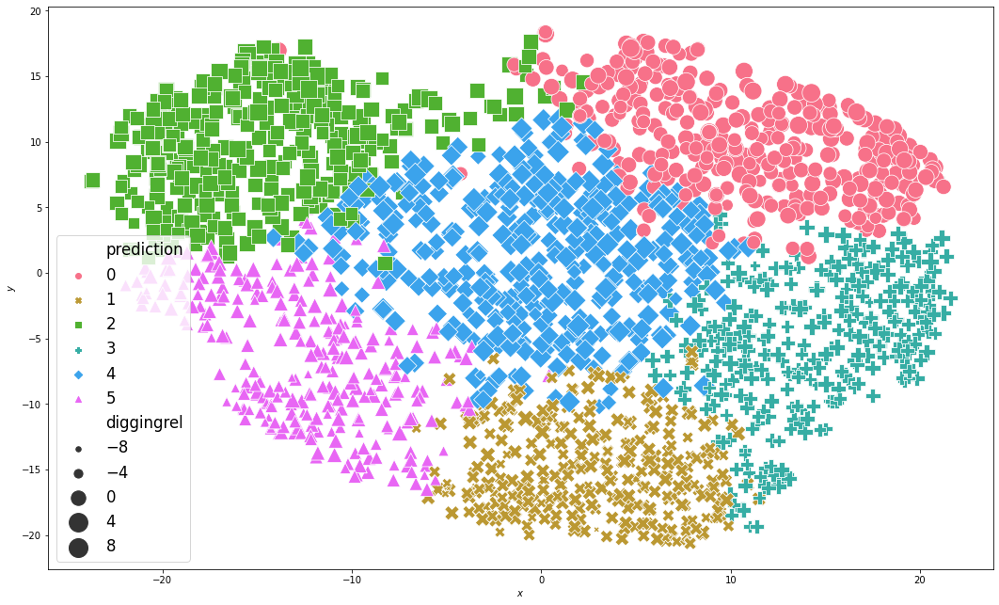

In [0]:
pairwise = raw[["fsexatt","fliked", "flikyes","sexatt","liked", "likyes"]]

km = KMeans(n_clusters = 6, max_iter=1000, random_state=1000)
Y_pred = km.fit_predict(pairwise)

df_km = pd.DataFrame(Y_pred, columns=['prediction'], index=raw.index)
kmdff = pd.concat([dff_pick, df_km], axis=1)

plot(kmdff,'prediction','diggingrel', 'prediction', num = 6)

#Questions i could possibly 

1. What is the proportion for each clusters.
2. what are means and standardard deviation romantic  dv score for each cluster
3. Using anova?
silhoute for some thing to be passed as certain score
test the validity of the clusters - 



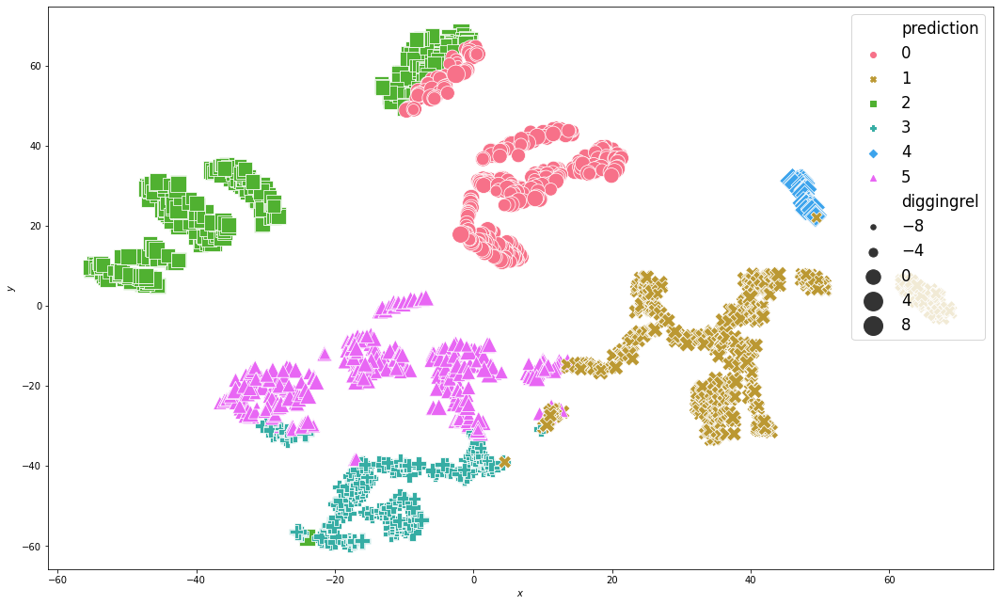

In [0]:
km = KMeans(n_clusters = 6, max_iter=10000, random_state=1000)
Y_pred = km.fit_predict(raw_post)

df_km = pd.DataFrame(Y_pred, columns=['prediction'], index=raw.index)
kmdff = pd.concat([dff, df_km], axis=1)

# Perform a K-Means clustering with K=2
# Show the clustering result
plot(kmdff,'prediction','diggingrel', 'prediction', num = 6)

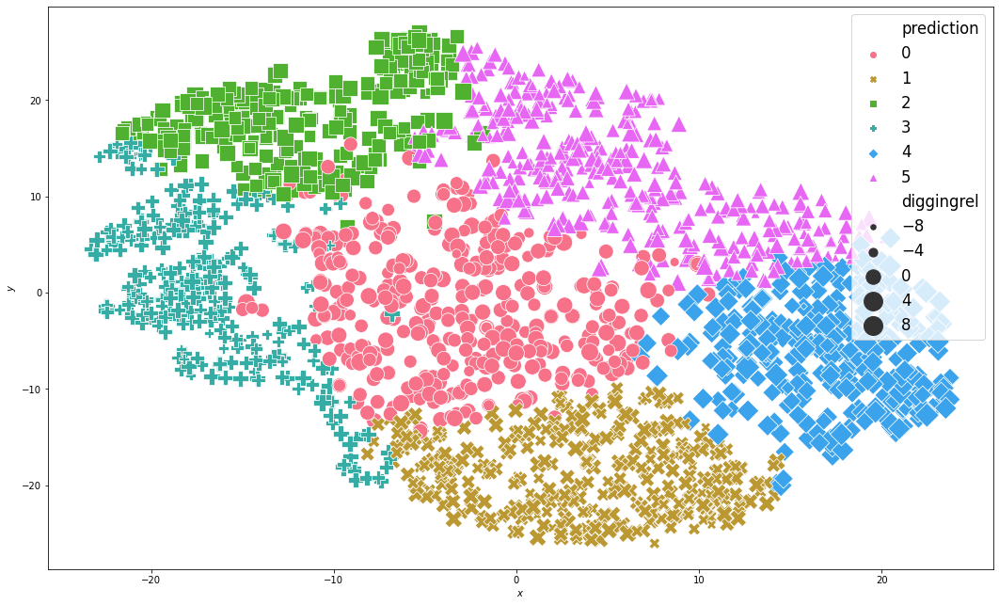

In [0]:
km = KMeans(n_clusters = 6, max_iter=10000, random_state=1000)
Y_pred = km.fit_predict(pairwise2)

df_km = pd.DataFrame(Y_pred, columns=['prediction'], index=raw.index)
kmdff = pd.concat([dff_pick3, df_km], axis=1)
plot(kmdff,'prediction','diggingrel', 'prediction', num = 6)

# My to do's 
0. run cluster analysis of all the feautures i showed above(or the ones geof this are interesting, so aks him!)
1. Give a numerical validation of the stregnth of the clusters (silhoutte)
2. run statistical analysis on the clusters (need help with this, basically what is psychology standard in running analysis)
3. run the same methodology on prior data and see what that looks like
4. I am done!!!!!!! verify with Geoff if this is suffficient


# mention this disclaimer
There are a lot better clustering algorithms than kmeans, however I (and other datascientists) tend to use kmeans as a preliminary clustering algorithm. I think the next improvemt on this reseach is to apply a soft clustering algorithm like gaussain mixtures and a heirachical cluster algortihm so that I don't have to pick a heuristic (picking 6) like in K means. 

# Assignmets for you
I need your help in pointing me to the right direction on what features i should use for the analysis or if there is something you would like to explore in the statistical analysis of the clusters.

In [0]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 3
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=50)
ani.save('inhadr_tsne1.gif', writer=animation.PillowWriter(fps=20))

#resources
http://blog.mahler83.net/2019/10/rotating-3d-t-sne-animated-gif-scatterplot-with-matplotlib/ - rotating 3d plot

https://machinelearningmastery.com/machine-learning-checklist/ - follow this check point

for graphin consider this: https://plotly.com/python/presentations-tool/